## Step 1. Pick a Major B2C Firm - Walmart
We decided to choose Walmart because it is one of the largest direct-to-consumer companies, not just in the United States, but globally. We also liked Walmart because it has numerous avenues for comparison: company size, geographic scope, and product offerings.

Furthermore, Walmart's name is unambiguous, which will help while scraping. Lastly, we thought Walmart wouldn't be too heavily discussed on Twitter, as there hasn't been too much recent controversy or trends around it.

## Step 2. Determine Walmart's Closest Competitors

When initially thinking about Walmart's competitors, a few obvious companies come to mind:

**Amazon - The Online Walmart**

---



Walmart is the second largest e-commerce retailer behind Amazon. While owning physical stores and running business completely online are drastically different, we wanted to compare these two companies because their products are very similar. First, They both offer the widest array of products (the average person can find just about anything they need through Amazon or Walmart). Second, both companies sell their products at close to the cheapest price possible. This is why the boast such large revenue figures.

**Kroger - The Food Competitor**

---


Walmart's grocery prices are an average of 4% lower when compared to Kroger. However, Kroger has a cheaper, and more organic selection of produce than Walmart. We decided to compare these two companies because a significant part of Walmart's business is its grocery store.

**Costco - The Dark Horse**

---


Our last competitor is different from the others, both in company size and in operations. Their warehouse stores sell groceries, electronics, food, and even furniture. Costco offers a similar variety of items as Walmart, but in bulk. Their low prices are comparable to Walmart, but the primary differentiators are the membership component of Costco and the number of stores (just 558 in the US).

# Imports

In [ ]:
pip install vaderSentiment

     |████████████████████████████████| 133kB 6.4MB/s 


In [ ]:
import pandas as pd
import numpy as np
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import re
import preprocessor as prepro
import seaborn as sns
import spacy
import heapq
import nltk
import string
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import itertools
from collections import Counter
import heapq
import matplotlib.pyplot as plt
from datetime import datetime

# Walmart

## Processing Tweets

In [ ]:
pd.set_option('max_colwidth', 20)
tweets = pd.read_json('/Users/reshea/488/Practice_Tweets/walmart.json', lines=True)

# Set-up patterns to be removed fro the tweets
pat1 = r"http\S+"
pat2 = r"#"
pat3 = r"@"
pat4 = r"FAV"
pat5 = r"RE"
pat6 = r"pic.\S+"
pat7 = r"\n"
pat8 = '\r\n'
pat9 = r'|'.join((r'&amp;',r'&copy;',r'&reg;',r'&quot;',r'&gt;',r'&lt;',r'&nbsp;',r'&apos;',r'&cent;',r'&euro;',r'&pound;'))
# Combine all patterns
combined_pat = r'|'.join((pat1, pat2, pat3, pat4, pat5, pat6, pat7, pat8, pat9))

# replace the patterns with an empty string
tweets['stripped'] =  [re.sub(combined_pat, '', w) for w in tweets.content]

# might have double spaces now (because of empty string replacements above) - remove double empty spaces
tweets['stripped']  = [re.sub(r"  ", ' ', w) for w in tweets.loc[:,'stripped']]

In [ ]:
# Instantiate the sentiment analyzer (if you haven't already done so)
analyser = SentimentIntensityAnalyzer()

# Now get the compound sentiment score for each tweet
tweets['C_Score'] = np.nan
for index, row in tweets.iterrows(): 
    tweets.loc[index, 'C_Score'] = analyser.polarity_scores(row['stripped'])['compound']

In [ ]:
# create new column
sentiment = []

# Loop through rows of dataframe and determine strings for new column "Sentiment"
for index, row in tweets.iterrows(): 
    if tweets.loc[index, 'C_Score'] > 0.05 : 
        sentiment.append("Positive")      
    elif tweets.loc[index, 'C_Score'] < -0.05 :
        sentiment.append("Negative")    
    else :
        sentiment.append("Neutral")    

tweets['Sentiment'] = sentiment
tweets['Sentiment'] = tweets['Sentiment'].astype("category")

## Sentiment Distribution

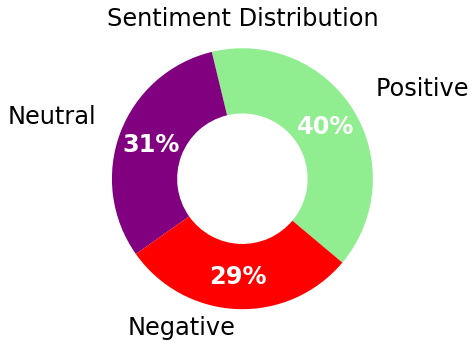

In [ ]:
# import necessary modules (if not already imported)
import matplotlib.pyplot as plt

# Set font size
plt.rcParams['font.size']=24

# Define figure
fig, ax = plt.subplots(figsize=(9, 6), subplot_kw=dict(aspect="equal"))

# Get count by sentiment category from tweets_df
sentiment_counts = tweets.Sentiment.value_counts()
labels = sentiment_counts.index

# Define colors
color_palette_list = ['lightgreen', 'purple', 'red','orange']

# Generate graph components
wedges, texts, autotexts = ax.pie(sentiment_counts, wedgeprops=dict(width=0.5), startangle=-40,  
       colors=color_palette_list[0:3], autopct='%1.0f%%', pctdistance=.75, textprops={'color':"w", 'weight':'bold'})

# Plot wedges
for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    ax.annotate(labels[i], xy=(x, y), xytext=(1.2*x, 1.2*y),
                horizontalalignment=horizontalalignment)
# Set title
ax.set_title("Sentiment Distribution", y=.95, fontsize = 24)

# Show Donut Chart
plt.show()

In [ ]:
import numpy as np
import re

# Let's try to identify tweets that are about covid-19
tweets['virus'] = np.where(tweets.stripped.str.contains('(?:^|\W)(pandemic|virus|covid-19|covid19|quarantine|lockdown)(?:$|\W)',                                                                                                      # beer|booze|brew|bottle|pint|hops|drink|beach
    flags = re.IGNORECASE), 1, 0)

# Let's try to identify tweets that are about target
tweets['target'] = np.where(tweets.stripped.str.contains('(?:^|\W)(target)(?:$|\W)',                                                                                    # (virus|covid-19|SARS-COV-2|vaccine|cough|coronavirus|mask|sick|spread|pandemic|death|covid|hospital|n95|ventilator|respiratory)(?:$|\W)',
    flags = re.IGNORECASE), 1, 0)

# Let's try to identify tweets that are about Amazon
tweets['amazon'] = np.where(tweets.stripped.str.contains('(?:^|\W)(amazon)(?:$|\W)',                                                                                    # (virus|covid-19|SARS-COV-2|vaccine|cough|coronavirus|mask|sick|spread|pandemic|death|covid|hospital|n95|ventilator|respiratory)(?:$|\W)',
    flags = re.IGNORECASE), 1, 0)

# Let's try to identify tweets that are about Kroger
tweets['kroger'] = np.where(tweets.stripped.str.contains('(?:^|\W)(kroger)(?:$|\W)',                                                                                    # (virus|covid-19|SARS-COV-2|vaccine|cough|coronavirus|mask|sick|spread|pandemic|death|covid|hospital|n95|ventilator|respiratory)(?:$|\W)',
    flags = re.IGNORECASE), 1, 0)

# Let's try to identify tweets that are about Costco
tweets['costco'] = np.where(tweets.stripped.str.contains('(?:^|\W)(costco)(?:$|\W)',                                                                                    # (virus|covid-19|SARS-COV-2|vaccine|cough|coronavirus|mask|sick|spread|pandemic|death|covid|hospital|n95|ventilator|respiratory)(?:$|\W)',
    flags = re.IGNORECASE), 1, 0)
 
# How many tweets of each topic?
# print(f"Total {tweets['Beer'].count()}")
print(f"Target {tweets['target'].sum()}")
print(f"amazon {tweets['amazon'].sum()}")
print(f"amazon {tweets['kroger'].sum()}")
print(f"amazon {tweets['costco'].sum()}")
print(f"virus {tweets['virus'].sum()}")

/Users/reshea/opt/anaconda3/lib/python3.7/site-packages/pandas/core/strings/accessor.py:101: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


Target 8091
amazon 4556
amazon 1491
amazon 1837
virus 4060


## Sentiment Distribution over Tweets about Virus

In [ ]:
walVirus = tweets.loc[(tweets.virus == 1)]

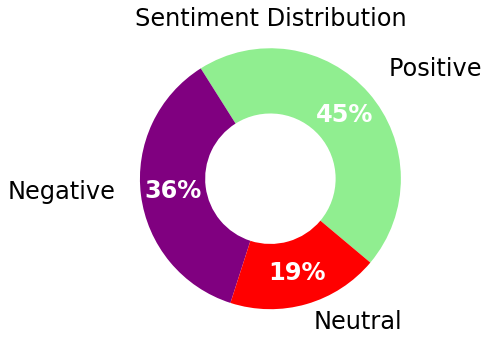

In [ ]:
# import necessary modules (if not already imported)
import matplotlib.pyplot as plt

# Set font size
plt.rcParams['font.size']=24

# Define figure
fig, ax = plt.subplots(figsize=(9, 6), subplot_kw=dict(aspect="equal"))

# Get count by sentiment category from tweets_df
sentiment_counts = walVirus.Sentiment.value_counts()
labels = sentiment_counts.index

# Define colors
color_palette_list = ['lightgreen', 'purple', 'red','orange']

# Generate graph components
wedges, texts, autotexts = ax.pie(sentiment_counts, wedgeprops=dict(width=0.5), startangle=-40,  
       colors=color_palette_list[0:3], autopct='%1.0f%%', pctdistance=.75, textprops={'color':"w", 'weight':'bold'})

# Plot wedges
for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    ax.annotate(labels[i], xy=(x, y), xytext=(1.2*x, 1.2*y),
                horizontalalignment=horizontalalignment)
# Set title
ax.set_title("Sentiment Distribution", y=.95, fontsize = 24)

# Show Donut Chart
plt.show()

## Text Summarizer

In [ ]:
def summarizer(df, pn):
    if pn == 'n':
        return negativeSummary(df)
    if pn == 'p': 
        return positiveSummary(df)
    else: 
        return "If positive enter p, if negative enter n"

# Used code from stackabuse.com
# This function takes sentences from each negative tweet and outputs the sentences that are most like the others
def negativeSummary(df):
    sentences = ""
    for x in df[df['Sentiment'] == 'Negative']['stripped']: 
        sentences += (str(x)+".")
    sentence_list = nltk.sent_tokenize(sentences)
    stopwords = nltk.corpus.stopwords.words('english')
    word_frequencies = {}
    for word in nltk.word_tokenize(sentences):
        if word not in stopwords:
            if word not in word_frequencies.keys():
                word_frequencies[word] = 1
            else:
                word_frequencies[word] += 1
    maximum_frequncy = max(word_frequencies.values())
    for word in word_frequencies.keys():
        word_frequencies[word] = (word_frequencies[word]/maximum_frequncy)
    sentence_scores = {}
    for sent in sentence_list:
        for word in nltk.word_tokenize(sent.lower()):
            if word in word_frequencies.keys():
                if len(sent.split(' ')) < 30:
                    if sent not in sentence_scores.keys():
                        sentence_scores[sent] = word_frequencies[word]
                    else:
                        sentence_scores[sent] += word_frequencies[word]
    summary_sentences = heapq.nlargest(7, sentence_scores, key=sentence_scores.get)
    summary = ' '.join(summary_sentences)
    return summary

# Used code from stackabuse.com
# This function takes sentences from each positive tweet and outputs the sentences that are most like the others
def positiveSummary(df):
    sentences = ""
    for x in df[df['Sentiment'] == 'Positive']['stripped']: 
        sentences += (str(x)+".")
    sentence_list = nltk.sent_tokenize(sentences)
    stopwords = nltk.corpus.stopwords.words('english')
    word_frequencies = {}
    for word in nltk.word_tokenize(sentences):
        if word not in stopwords:
            if word not in word_frequencies.keys():
                word_frequencies[word] = 1
            else:
                word_frequencies[word] += 1
    maximum_frequncy = max(word_frequencies.values())
    for word in word_frequencies.keys():
        word_frequencies[word] = (word_frequencies[word]/maximum_frequncy)
    sentence_scores = {}
    for sent in sentence_list:
        for word in nltk.word_tokenize(sent.lower()):
            if word in word_frequencies.keys():
                if len(sent.split(' ')) < 30:
                    if sent not in sentence_scores.keys():
                        sentence_scores[sent] = word_frequencies[word]
                    else:
                        sentence_scores[sent] += word_frequencies[word]
    summary_sentences = heapq.nlargest(7, sentence_scores, key=sentence_scores.get)
    summary = ' '.join(summary_sentences)
    return summary

## Negative Word Cloud

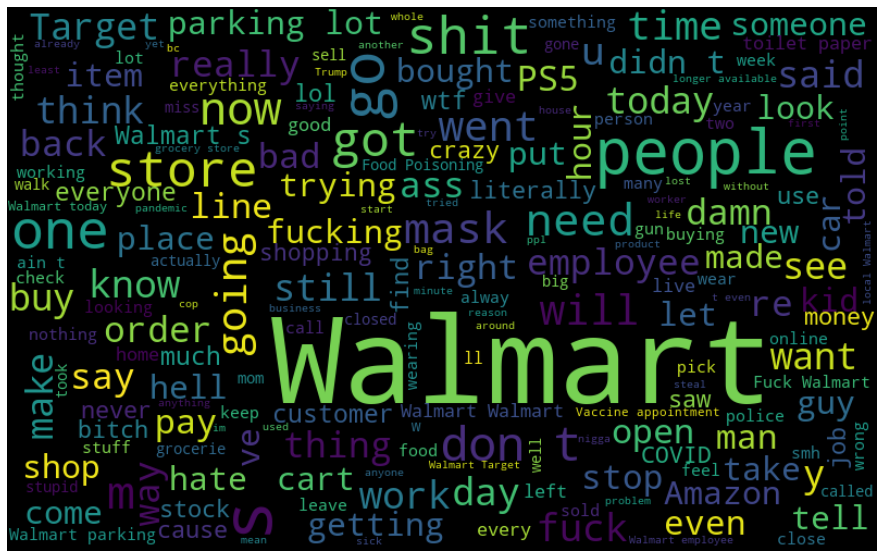

In [ ]:
# 1. Import module 
from wordcloud import WordCloud

# 2. Create bag of words for tweets of Negative sentiment
all_neg_words = ' '.join([text for text in tweets[tweets['Sentiment'] == 'Negative']['stripped']])

# 3. Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_neg_words)

# 4. Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [ ]:
# Major negative words featured in the word cloud
neg_words = ['stock','target', 'parking lot', 'PS5', 'employee',
             'fucking', 'mask', 'hell', 'vaccine appointment', 'fuck walmart', 
             'gun', 'pay', 'crazy', 'customer', 'order', 'trump', 'longer available', 
             'car', 'shit', 'time', 'Amazon','covid', 'hour', 'hate']

In [ ]:
negative_walmart = tweets[tweets['Sentiment']== "Negative"]

In [ ]:
# Mean Compund score for tweets containing words from word cloud
negative_words = []
for i in range(len(neg_words)):
    negative_words.append((neg_words[i],negative_walmart[negative_walmart["stripped"].str.contains(neg_words[i])].C_Score.mean()))
negative_words.sort()
for pairs in negative_words:
    print(pairs[0],pairs[1])

Amazon -0.4211559183673475
PS5 -0.4983726176115796
car -0.5121663835616423
covid -0.5101431972789116
crazy -0.503392105263157
customer -0.5270918707149855
employee -0.5227553857350798
fuck walmart -0.6142868852459017
fucking -0.6020383211678827
gun -0.5916610803324094
hate -0.6074775798525851
hell -0.6356463861920156
hour -0.4776042142230015
longer available -0.3064362660944229
mask -0.5001641317130542
order -0.49470093403386056
parking lot -0.4999234223300963
pay -0.4527168289290695
shit -0.6190370479270741
stock -0.4787305224564617
target -0.4919924675324674
time -0.4960632367972738
trump -0.5425875000000001
vaccine appointment -0.5835


### Analyzing Negative Tweets that include "stock"

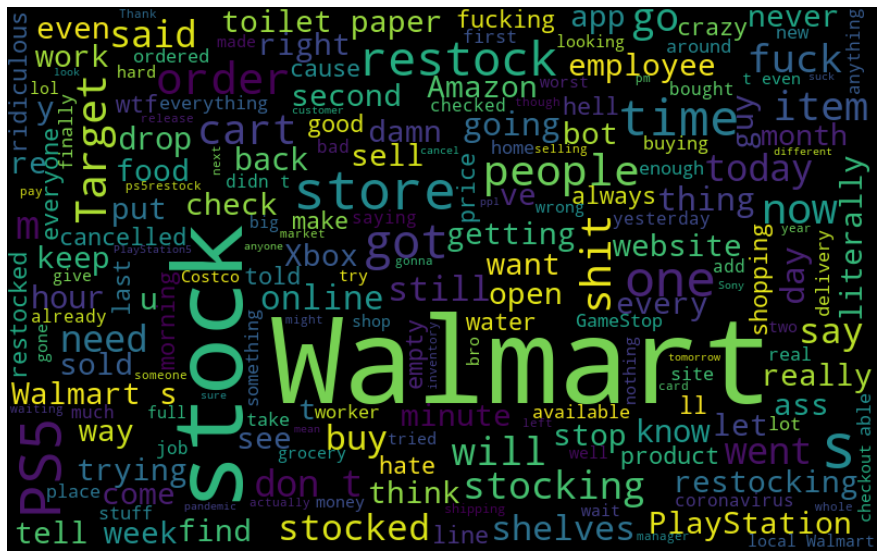

In [ ]:
pd.set_option('max_colwidth', 20)
wal_stock = negative_walmart[negative_walmart["stripped"].str.contains("stock")]

# 1. Import module 
from wordcloud import WordCloud

# 2. Create bag of words for tweets of certain sentiment
all_stock_words = ' '.join([text for text in wal_stock[wal_stock['Sentiment'] == 'Negative']['stripped']])

# 3. Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_stock_words)

# 4. Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [ ]:
for i in range(850,855):
    print(wal_stock.date.iloc[i], wal_stock.stripped.iloc[i]) 
    print('\n')

2020-04-10 01:13:45+00:00 Walmart can you find out what days the lake park Walmart in west palm beach on Congress gets their toilet paper and paper towels restocked because this daily scavenger hunt is annoying🤬


2020-04-09 15:24:17+00:00 Workers Walmart in Fenton Missouri ignore CDCgov WhiteHouse warnings by not wearing masks (or gloves) while stocking shelves. They told me the company gave them the “option” to wear masks. The good news is, I got toiletpaper Covid_19 COVID coronavirus 


2020-04-08 14:59:12+00:00 Ugh Walmart cancelled my order because they’re stupid and can’t keep their stock up to date on their website so I just bought a somewhat price gouged one on eBay


2020-04-08 02:35:54+00:00 There is NO WAY that closing kroger MyKingSoopers Walmart vons or Safeway early is actually helping with restocking the shelves. Please correct me if I'm wrong.


2020-04-07 23:56:15+00:00 So I went out today for the first time in three weeks .Walmart- busy as hell business as usual- no T

In [ ]:
print(summarizer(wal_stock, 'n'))

They’re out of stock right now....”Yeah, dipshit, everyone is!.Walmart Purchased a “deal” yesterday. Had it in the cart, in the process of checking out.... and then Walmart is overloaded, and then tells me it’s out of stock!!!! Amazon, Apple, TJX(Marshall's, TJMaxx), Nike, Walmart.....dude_masc Got followed an harassed at Walmart for sagging to hard on these hoes...then yung Walmart hood stocker peeped sideways twice. !.ADoseOfPetey Y’all are going to the wrong ones lol The heb, Lowe’s, cvs and neighborhood Walmart’s by us are all stocked. I can’t tell you how many times I place a pick up order and it says “sorry, we don’t have that in stock, your order has been cancelled”. So I ask and they’re like “ If It’s not there then we don’t have any” 🙄.Looks like Walmart is also infected with “buy all the TCG’s!” Sickness. I’m afraid theresgoing to be a lot of wasted food ☹️.Went to Petsmart, Petco, Walmart and King Soopers and STILLLLL can’t find Daryl’s dog food.


In [ ]:
wal_stock.date = pd.to_datetime(wal_stock.date)
wal_stock['Date'] = [x.date() for x in wal_stock['date']]
wal_stock['month'] = [x.month for x in wal_stock['date']]
wal_stock_time= wal_stock.groupby(['Date', 'month']).count()
wal_stock_time = wal_stock_time.reset_index()[['Date','month', 'content']]

/Users/reshea/opt/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/reshea/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/reshea/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See 

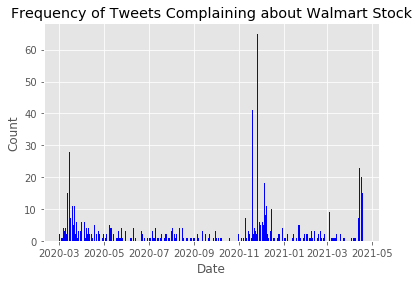

In [ ]:
import datetime as dt
plt.style.use('ggplot')
plt.bar(wal_stock_time['Date'], wal_stock_time['content'], color='blue', align='edge')
plt.title('Frequency of Tweets Complaining about Walmart Stock')
plt.xlabel("Date")
plt.ylabel("Count")
plt.savefig('foo.png', dpi=95)
plt.show()

### Analyzing Negative Tweets that include "target"

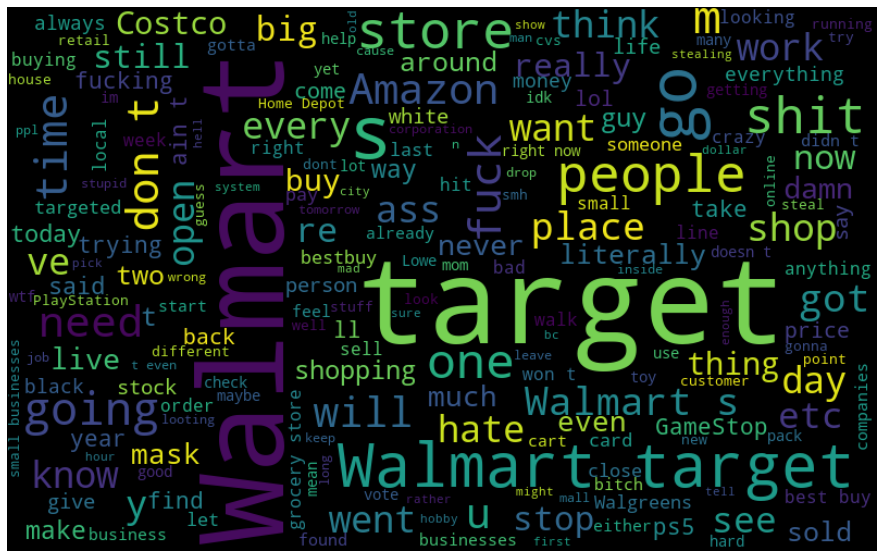

In [ ]:
pd.set_option('max_colwidth', 20)
wal_target = negative_walmart[negative_walmart["stripped"].str.contains("target")]

# 1. Import module 
from wordcloud import WordCloud

# 2. Create bag of words for tweets of certain sentiment
all_target_words = ' '.join([text for text in wal_target[wal_target['Sentiment'] == 'Negative']['stripped']])

# 3. Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_target_words)

# 4. Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [ ]:
print(summarizer(wal_target, 'n'))

!.Casinos, bars, restaurants, Walmart, target, retail stores, are open, schools set to open but uhhhh fuck the gym?.ThatOneLightKid Yea my price target was $400. The nastiest and sick mfs be Walmart, retail centers, target, general labor, etc..RyanPhillippe Ryan, since we can go shopping, it's walmart target Vons 4 groceries, plus laundromat. Walmart, target, CVS, Trader Joe’s, Costco, gas stations, 7 Eleven, Etc. !.Checked my email and all I am reading is corona virus from target, Walmart, Sears, Sephora, Ulta, Macy’s, Expedia. Almost every day, I see college students from both Radford VT "group shopping" at Walmart, Target, TjMaxx, Mall area, restaurants, etc. target, walmart, amazon have all fucked up the preorders..steinekin MilanKLee Only took me: failed on target at checkout, failed at Walmart at checkout, Microsoft store won’t load. Walmart/target didn’t have shit!.I stopped at some targets and Walmart’s in stl and couldn’t find a single Pokémon card, I now feel y’all’s pain tha

In [ ]:
for i in range(50):
    print(wal_target.date.iloc[i], wal_target.stripped.iloc[i]) 
    print('\n')

2021-04-19 22:21:41+00:00 _yogi_Bear_61 kathykuhns01 I would not help protect the local Walmart, target and others since they donated to this bullshit. However, myself and neighbors would not let the rioters damaged our neighborhood! I don't think it will be an issue here! 👇 


2021-04-19 20:37:11+00:00 furioursus lilchurropdx Multiple industry analysts have Walmart as their 1 competitor. And people are extremely price sensitive right now. I’m acknowledging Kroger is in a tough situation. Also this legislation unfairly targets a small number of companies.


2021-04-19 18:39:50+00:00 It’s no target near me sadly but imma check my Walmart.


2021-04-19 18:32:37+00:00 ListenHere12 thehill The rates are very low where I live but u have to wear a mask the only places that are full capacity are Walmart,target and casinos where I live which makes no since movie theaters are closed and places that are open that are not big corporate stores can only have like 20% cap


2021-04-19 18:27:43+00:00

### Analyzing Negative Tweets that include "hell"

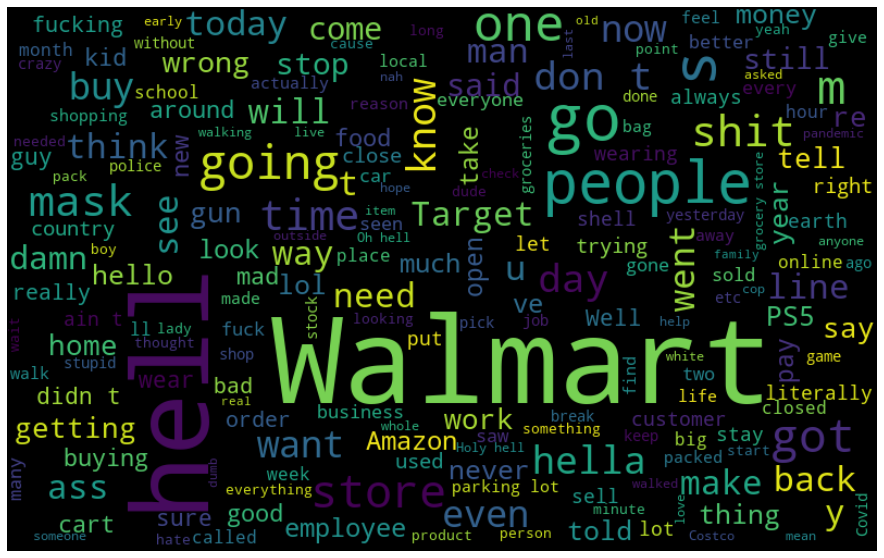

In [ ]:
pd.set_option('max_colwidth', 20)
wal_hell = (negative_walmart[negative_walmart["stripped"].str.contains("hell")])
# 1. Import module 
from wordcloud import WordCloud

# 2. Create bag of words for tweets of certain sentiment
all_hell_words = ' '.join([text for text in wal_hell[wal_hell['Sentiment'] == 'Negative']['stripped']])

# 3. Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_hell_words)

# 4. Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [ ]:
print(summarizer(wal_hell, 'n'))

😬 2020 has been a hell of a year..Littlefish_5 Amazon, pampered chef, crate and barrel, hell, even walmart.Fuck Walmart and Playstation for the way they handled that PS5 release. Take it back to elementary!.DLoesch That is just stupid Walmart is open why in hell would you stop them form selling everything!!!!!!! Even tho I got mine from an expensive clothing company :(.RepMattGaetz If by the “deep state” you mean, Shell, CVS, Facebook, Amazon, Walmart, BP. hardcandyglasses hc13bluetortoiseshell prescriptionglasses walmartoptical icanseeclearlynow hardcandylife walmart Sonora, California .Clinton Walmart hell cause it’s all SE Maryland Walmart lol .gtconway3dg corabora5 You’re eight George, I’m banning Walmart. But it's cool to keep packing your local Lowes, Home Depot, Walmart, Target, hell go to the gym if you want. Be careful how you gloat because your loved one could be next inside Walmart, spa, eatery, school, etc..StormTheArtist Yeah, and at least Wal-Mart doesn't treat its employ

In [ ]:
for i in range(900,905):
    print(wal_hell.date.iloc[i], wal_hell.stripped.iloc[i]) 
    print('\n')

2020-03-13 18:20:03+00:00 I was just at Walmart in Palmyra, and this couple in front of me bought 80 rolls of TP. What the hell do you do with 80 rolls of TP? Are they gonna fashion some sort of arts crafts masks or something?This is the zombie apocalypse, isn’t it? 


2020-03-13 17:02:58+00:00 So you saying people didn't wash dishes before? Why is my dish soap gone, Walmart looks like an empty warehouse and a the soap is gone! I'ma need people to calm thee hell down with this virus. 👀😒 


2020-03-13 16:07:30+00:00 Walmart. Holy hell.... 


2020-03-13 03:40:51+00:00 Walmart need to clean the hell up i can’t even check out without roaches flying out at me


2020-03-12 17:09:12+00:00 Walmart Chocolate chip or oatmeal raisin can y’all ship me some it’s raining hard as hell !👀




### Analyzing Negative Tweets that include "vaccine"

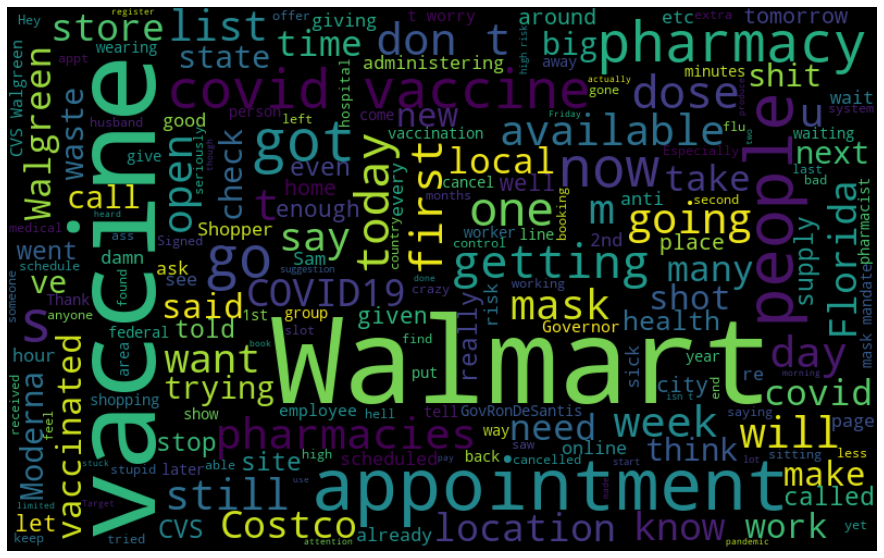

In [ ]:
pd.set_option('max_colwidth', 20)
wal_vax = negative_walmart[negative_walmart["stripped"].str.contains("vaccine")]

# 1. Import module 
from wordcloud import WordCloud

# 2. Create bag of words for tweets of certain sentiment
all_vax_words = ' '.join([text for text in wal_vax[wal_vax['Sentiment'] == 'Negative']['stripped']])

# 3. Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_vax_words)

# 4. Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

Looking at the words in the word cloud, the words, trying, unsuccessfully, and covid stand out. 

In [ ]:
# Looking at summary for 'vaccine'
print(summarizer(wal_vax, 'n'))

basis, and in very short supply.So far, I’ve seen no PBC CVS, Walgreens, Walmart, Sams, Costco pharmacies with any vaccine supply. So it’s back to square one, and trying to find another appointment..Your no-appointment vaccine options today, Hartford: St Lawrence O’Tool on New Britain Ave, Mt. I told her that you can get them at Walmart, Sam's, Ingles, anywhere, FE. I’ll take the vaccine when it comes to Walmart, but I don’t go to the dr. unless I’m sick. .POTUS Given the fear the Democrats have created in the public about this election infection, how is a vaccine that doesn’t guarantee reinfection, spread, remove idiotic mask mandates help? Now it’s about a vaccine, it’s not about a virus all it’s about control. Pharmacies in SamsClub, Walmart, HyVee, cvspharmacy HealthMart are also offering vaccines.


In [ ]:
for i in range(5):
    print(wal_vax.date.iloc[i], wal_vax.content.iloc[i]) 
    print('\n')

2021-04-19 23:34:30+00:00 Spent the morning trying to book a vaccine appointment with pharmacies at Costco, Walmart, Shoppers unsuccessfully, which made me sulk the rest of the day and now I am exhausted. Can I sleep till it is all over?


2021-04-19 23:17:40+00:00 just got the covid vaccine and I swear I’m going to blackout in this Walmart pharmacy


2021-04-19 22:40:36+00:00 @ShivAroor Why it is difficult to get the vaccine in India. Why can pharmacists give the vaccines? In US CVS, Walgreens, Walmart, and many Pharmacists have given the Vaccine?


2021-04-19 22:35:56+00:00 @StefKunkel I think Walmart, Target and multi state companies should pay as much attention to this as they did his asinine vaccine roll out.


2021-04-19 22:20:26+00:00 @slider19831 @dark1x I think it was deleted cause John was being harassed by a bigoted European that falsely accused him of "cutting in line in front of grandma" to get vaccinated. He offered consoles/games to get a vaccine shipped over somehow. I 

In [ ]:
# Looking at summary for 'vaccine' and 'appointment'
wal_vax = wal_vax[wal_vax["stripped"].str.contains("appointment")]
print(summarizer(wal_vax, 'n'))

So it’s back to square one, and trying to find another appointment..Your no-appointment vaccine options today, Hartford: St Lawrence O’Tool on New Britain Ave, Mt. !.If you’re having trouble scheduling an appointment for a Covid vaccine, check out this link. No wonder the appointments are already taken..Erinfor12 Well I’m concerned because Walmart took teachers off the list to get the vaccine so I can’t register for my second appointment. Walmart has a covid vaccine scheduler online.At long last, and after weeks of trying, I finally have an appointment for a vaccine! Of course the team’s hard at work over at Dunkin Ballpark too!GetVaccinated.TheKagerouDayz Walgreens, CVS and most pharmacies are offering the vaccine. I just made a vaccine appointment at Walmart next week..DestinyFomo I made an appointment for next week at a Walmart that actually has some Moderna shots. COVID.Missouri is an unorganized mess, and the lack of vaccine doses isn’t helping.


In [ ]:
for i in range(15, 20):
    print(wal_vax.date.iloc[i], wal_vax.content.iloc[i]) 
    print('\n')

2021-04-19 13:53:51+00:00 @bruce_arthur The whole approach isn’t working for those that need it most, at the same time if vaccines have been distributed (I.e. pharmacies, Walmart etc) the train left the station would be extremely difficult to return and redirect vaccines (reconciliation of lots etc)


2021-04-19 13:51:35+00:00 Two Walmart employees having a big anti vaccine discussion in the aisle. Both ladies had all of the OAN/MAGA talking points down. I told them they’re the reason we are still doing this a year plus later


2021-04-19 13:32:47+00:00 Signed up for vaccine shot 1 Friday! I work in Walmarts and they do them at Walmart I'm getting that shit done on the clock, take that corporate america!


2021-04-19 12:31:04+00:00 Tried Shoppers, Walmart and Costco for vaccine appointment for husband... all say wait list or no appointments available @VaccineHunters


2021-04-19 00:31:21+00:00 @MommyGearest @Walmart Double check...I’ve heard of several people getting appointments onlin

Biggest issue here is about people being turned away from scheduled vaccination appointments. 

### Analyzing Negative Tweets that include "parking lot"

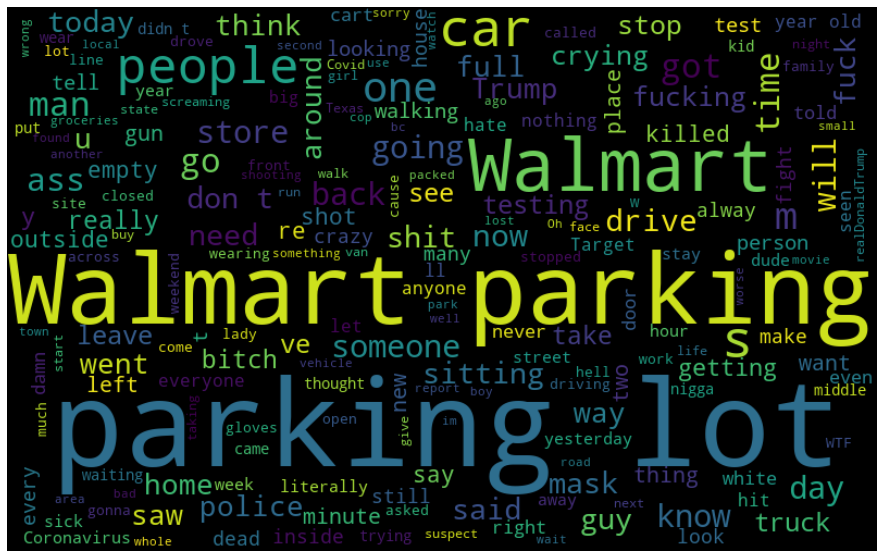

In [ ]:
pd.set_option('max_colwidth', 20)
wal_parklot = negative_walmart[negative_walmart["stripped"].str.contains("parking lot")]

# 1. Import module 
from wordcloud import WordCloud

# 2. Create bag of words for tweets of certain sentiment
all_park_words = ' '.join([text for text in wal_parklot[wal_parklot['Sentiment'] == 'Negative']['stripped']])

# 3. Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_park_words)

# 4. Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [ ]:
# Looking at summary for 'vaccine'
print(summarizer(wal_parklot, 'n'))

Urge them to add hot car warning signs to all store entrances parking lots. Amarillo?.The Walmart parking lot itself gives me so much anxiety .duchampcaged ConwayPolice jasonrapert Umm... people don’t shoot people if they don’t mug people in Walmart parking lot. !.Take that shit to Walmart this is a Publix parking lot, we have standards here.I’m in Walmart parking lot sobbing like the big ass baby I am. Wtf.The Walmart parking lot is 4 losers..This car is literally on fire in the Walmart parking lot.No lineup but parking lot is full. They're in the parking lot at 5 am, and we don't open until 7, and the rep doesn't stock until 9..The argument took place in a Walmart parking lot. Why aren’t y’all waiting in kroger, and Walmart parking lots, or the Liquor Stores?Here’s why, y’all don’t want JesusChrist in our lives! These people are in their cars, they aren’t as close as someone gets standing in Walmart, CVS or parking in any parking lot at a big store.


In [ ]:
for i in range(39, 75):
    print(wal_parklot.date.iloc[i], wal_parklot.content.iloc[i]) 
    print('\n')

2021-04-17 18:44:25+00:00 cried at walmart parking lot at 4am


2021-04-17 14:21:36+00:00 @hare_enciel i'd fight her in a walmart parking lot


2021-04-17 14:20:52+00:00 @PHANNY_0601 Walmart parking lot probably in the cart 😭 went back and nothing


2021-04-17 13:59:38+00:00 Currently in Georgetown and 3 white vans just unloaded vehicles full of ILLEGALS. I actually spoke to the driver of one of the vans and he told me that he was PAID to drive them into Georgetown and drop them off at the WALMART parking lot and another van would pick them up. https://t.co/V7mY1zdTGB


2021-04-17 13:21:50+00:00 So they sent me for an appraisal for the hail damage to a Walmart parking lot that was supposed to be a collision center @ 8am that’s also supposed to be closed on a Saturdays??? Count your fucking days @GEICO


2021-04-17 04:59:35+00:00 @soonergrunt It's when you drop a small-block V8 into a 1993 Mercury Tracer, beef up the brakes and tires, put down some bleach puddles, and scorch 'em in the 

## Finding Positive Experiences

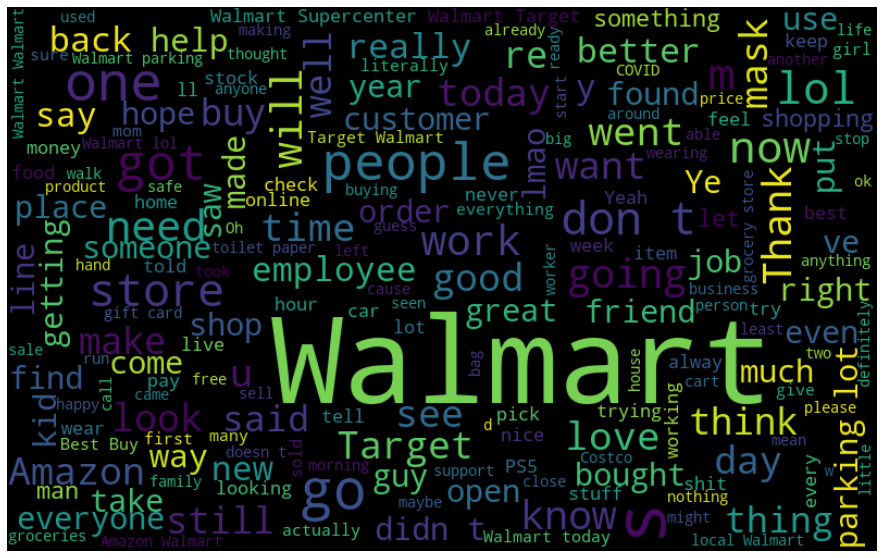

In [ ]:
# 1. Import module 
from wordcloud import WordCloud

# 2. Create bag of words for tweets of certain sentiment
all_pos_words = ' '.join([text for text in tweets[tweets['Sentiment'] == 'Positive']['stripped']])

# 3. Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_pos_words)

# 4. Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

**Words that stand out**
* employee
* one
* people
* Target
* love
* mask
* Thank
* friend
* great
* go
* still
* will
* better 
* help
We should note that the words virus and covid are not in the word cloud. 

In [ ]:
# positive tweets
positive_walmart = tweets[tweets['Sentiment'] == 'Positive']

In [ ]:
# Looking at mean compund scores for tweets containing specific positive words
pos_words = ['employee', 'one', 'people', 'Target', 'love', 'mask', 
            'thank', 'friend', 'great', 'go', 'still', 'will', 'better', 
             'help', 'bought']
positive_words = []
for i in range(len(pos_words)):
    positive_words.append((pos_words[i],positive_walmart[positive_walmart["stripped"].str.contains(pos_words[i])].C_Score.mean()))
positive_words.sort()
for pairs in positive_words:
    print(pairs[0],pairs[1])

Target 0.5554151138716346
better 0.6014215611353674
bought 0.5574415596330283
employee 0.5277443867618433
friend 0.6543272457312578
go 0.550459141111515
great 0.731395363214839
help 0.6066293979303847
love 0.7084030787684865
mask 0.5099901535005608
one 0.5435699218399169
people 0.5185914480322869
still 0.5291106323447119
thank 0.67837544
will 0.550698539435245


### Analyzing Positive Tweets that include "friend"

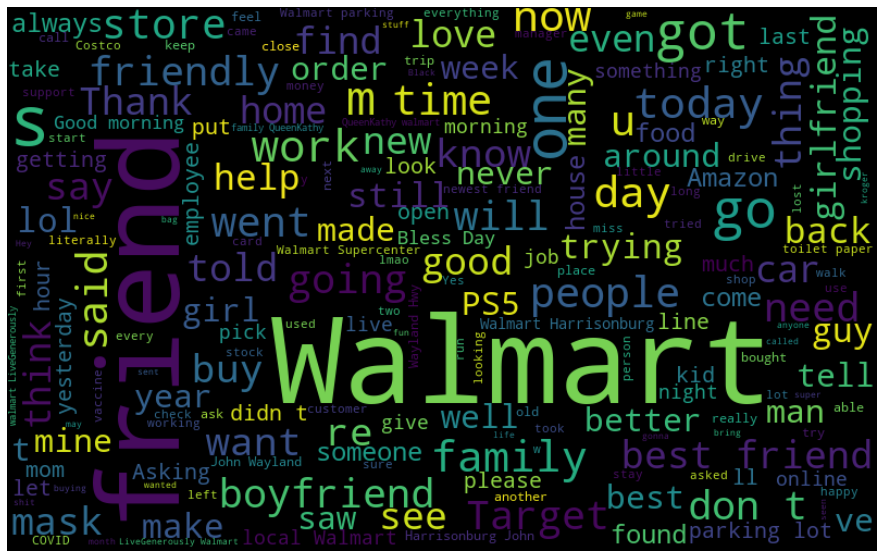

In [ ]:
pd.set_option('max_colwidth', 20)
wal_friend = positive_walmart[positive_walmart["stripped"].str.contains("friend")]

# 1. Import module 
from wordcloud import WordCloud

# 2. Create bag of words for tweets of certain sentiment
all_friend_words = ' '.join([text for text in wal_friend[wal_friend['Sentiment'] == 'Positive']['stripped']])

# 3. Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_friend_words)

# 4. Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [ ]:
print(summarizer(wal_friend, 'p'))

Our friends at the Victoria WorkBC Centre, in partnership with marchofdimescda, is hosting a virtual presentation on April 27 with WalmartCanada. 🦦 i’m tryna travel, try new food, visit each other hometowns, explore nature, walk the city, go on adventures, and get kicked out of Walmart 🥺 any takers ? I also have a real job, girlfriend, shower, and feed my kid everyday 😅.CardPurchaser Walmart for me is the spot, that’s where I’ve found hockey and baseball. When u go to Lowe’s, Walmart, other friends, other businesses then obviously you’re not practicing social distancing AND most people are not sanitizing and wearing mask and gloves. Clean, safe store and friendly staff Godbless SamWalton retail.Well, friends, I got dressed up today like I was going to Bayou Beer Garden, to go to Walmart on Lapalco. COVID19 coronavirus.Target, Walmart, Kroger, Sams Club, Costco, and HEB all running out of stuff and super chaotic. If this works, I expect to get a friend request so we can game together..A

In [ ]:
for i in range(5):
    print(wal_friend.date.iloc[i], wal_friend.content.iloc[i]) 
    print('\n')

2021-04-19 23:21:41+00:00 @BlazarSeeda I don't expect fucking WALMART to do the right thing. I DO fucking want my friends and colleagues in dance music to at least TRY not be selfish, greedy, immoral jerkoffs by doing too much too soon in a pandemic.


2021-04-19 23:07:38+00:00 @cuppatabby Meanwhile, my mother is trying to get me to ditch face masks and wave my vaccine card at the Walmart greeters like a Karen, and she can't understand why I won't do it.  I can't wait to get back around friends.


2021-04-19 22:51:30+00:00 so I️ ordered my friend a fix cooker why walmart sent her some damn milk😂 like how


2021-04-19 22:25:42+00:00 @NHL Those days were amazing. My friends and I would go to Walmart after school and go to the entertainment section and play Golden Eye and 1080 on the N64 deno stations for hours 😭


2021-04-19 21:25:36+00:00 I just acted like a brat in Walmart and now my boyfriend is buying me an animal crossing switch 😂😂😂 he needs to stop feeding into my mess or I’ll alwa

### Analyzing Positive Tweets that include "employee"

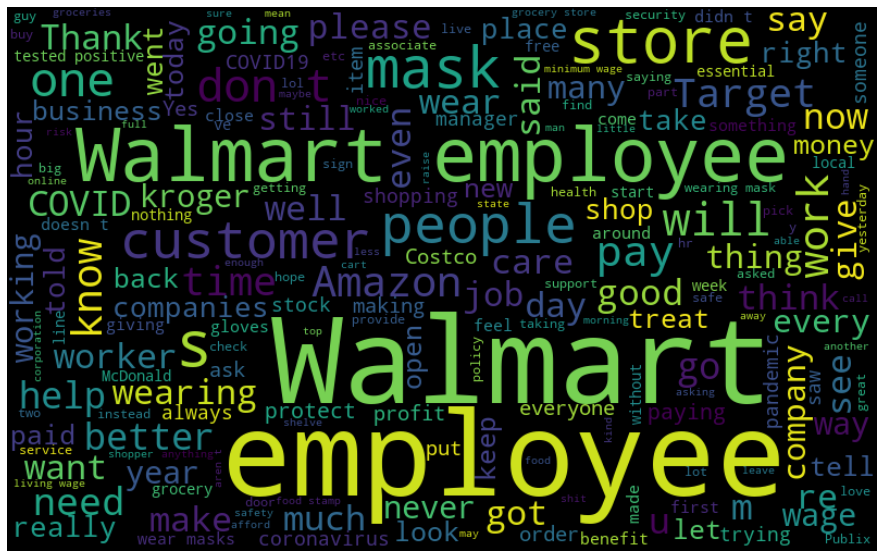

In [ ]:
pd.set_option('max_colwidth', 20)
wal_emp = positive_walmart[positive_walmart["stripped"].str.contains("employee")]

# 1. Import module 
from wordcloud import WordCloud

# 2. Create bag of words for tweets of certain sentiment
all_emp_words = ' '.join([text for text in wal_emp[wal_emp['Sentiment'] == 'Positive']['stripped']])

# 3. Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_emp_words)

# 4. Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [ ]:
print(summarizer(wal_emp, 'p'))

Shalom.MO: Last month, 81 Walmart and 9 Sam’s Club employees were diagnosed with COVID-19.Yesterday, Worcester’s city manager announced 19 more Sam’s Club employees tested positive. This isn't protecting employees, it's optics at best..L88Peter A professional athlete is an employee, just like the employee of a corporation like Walmart, Harmons Target or Best Buy. Doug McMillon, the retailer’s C.E.O., who also chairs the influential Business Roundtable lobby group, sent a note to employees to explain the company’s position. ..You’d think companies like Uber, Lyft, DoorDash, Walmart, would want universal healthcare to keep their pool of employees healthy... .newsbreakApp How is this ok? Also, walmart is more than just store staff, the home office and tech employees are paid very well..bosskiller831 MnemonicSyntax DanPriceSeattle Don’t forget the taxpayers are subsidizing Walmart, Amazon etc. We are all in this together friend 😘.masksnoworg grantstern Yes, please, the Walmart employees do

In [ ]:
print(summarizer(wal_emp[wal_emp.stripped.str.contains('good')], 'p'))

I vote Democrat, have a college degree, a Hispanic husband, speak Spanish, French, Italian ASL. It’s really not your money it’s the people’s realDonaldTrump SebGorka ScottBaio RealJamesWoods seanhannity.The customers at Walmart are doing a pretty good job of social distancing. .TheSiteSupply no line at my Walmart and I had an employee scan yesterday said they’re getting 6 in this morning, too good to be true?.Wanna know something messed up? Move on !.the duck inside platts walmart: *sitting*walmart employees: *clapping* very good.If you work at Walmart, good luck Charlie. She took a temp job, and almost immediately was promoted into a cash-management job..pankisseskafka BS store managers generally make good money.. it's your job Andy, do your fucking job. If an item costs $2 to sell and make, and Walmart sells it for $39, I think they can afford income tax and not fire their employees. I go to my favorite Rouse's because they are well managed, nice, and hire a good bit of disabled and 

In [ ]:
print(summarizer(wal_emp[wal_emp.stripped.str.contains('customer')], 'p'))

Another thing .... everybody from the employees to customers got on face mask BUT WHO... white folks 😂😂😂.Thanks Walmart walmarthelp for requiring all customers employees to wear a mask. I vote Democrat, have a college degree, a Hispanic husband, speak Spanish, French, Italian ASL. I'm retired frm WM, am a college grad, vote D, speak Spanish..ChrisA_425 HueyPNewton13 Pls stop stereotyping all Walmart customers /or employees as pale garbage. HEB, Walmart, and others are reducing hours, limiting entry’s, and other steps. At Walmart on Sunday, numerous times employees would casually walk by, in pairs, not avoiding customers. 6 feet isn’t enough..I’m still shocked to see that PhysicalDistancing between employees and employees and customers at stores like Walmart LoblawsON Is not happening. If you don’t care about customers, you don’t care about your customers.


In [ ]:
for i in range(5):
    print(wal_emp.date.iloc[i], wal_emp.content.iloc[i]) 
    print('\n')

2021-04-19 23:12:40+00:00 .@walmart, @walmarthelp what are you doing to ensure that your employees and partnered services are nondiscriminatory? Disabled people like myself should NEVER fear opening their doors for groceries because we're some sort of "inconvenience".


2021-04-19 22:52:34+00:00 There should be a law that caps CEO pay at 50x the average wage/ salary of all employees. 50x. That's still rich as fuck. Want to increase your pay? Increase your fucking wages. @Kroger @McDonalds @HomeDepot @WalMart


2021-04-19 21:55:26+00:00 LRT: Kroger is our go-to grocery store, because it has the best variety and isn't Walmart. My husband and I have been thinking about switching to Harp's, which is a smaller chain that's supposedly employee-owned.


2021-04-19 20:55:49+00:00 “The manager doesn’t know what’s going on”
*laughs in Walmart employee* 😂 https://t.co/1ySIFcMEGx


2021-04-19 20:24:57+00:00 @besf0rt Walmart *asking for $* to "feed people" in a radio ad. wm doesn't pay a living wag

### Analyzing Positive Tweets that include "love"

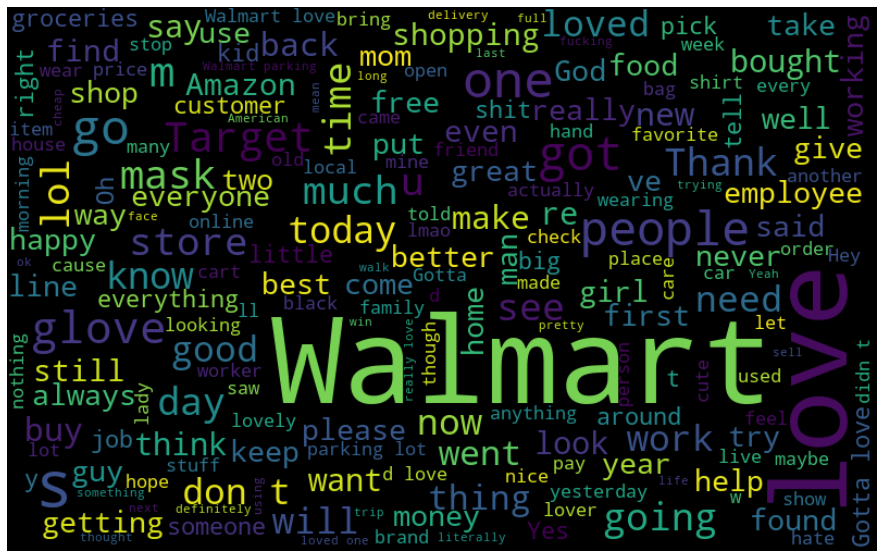

In [ ]:
pd.set_option('max_colwidth', 20)
wal_love = positive_walmart[positive_walmart["stripped"].str.contains("love")]

# 1. Import module 
from wordcloud import WordCloud

# 2. Create bag of words for tweets of certain sentiment
all_love_words = ' '.join([text for text in wal_love[wal_love['Sentiment'] == 'Positive']['stripped']])

# 3. Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_love_words)

# 4. Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [ ]:
print(summarizer(wal_love, 'p'))

I love it! Between the gloves, the mouthpieces, the helmets, the face shields, and the temp checks - that's safer than shopping at Walmart for 90 minutes. Would love to try and get it back to the owner. We can build Walmart’s bulbs better here in Bucyrus, Ohio! I was just at Walmart and the shelves are completely out of TP, hand sanitizer, soap, disinfectant, vitamin C, zinc, masks, and gloves. Then they incoherently babble on about “control” or “Communism”..Word cause those anti-mask people love Walmart lol .Target please enforce a mask policy!!!!!!! .... except during covid19wa crisesPeople really love frozen foods, canned goods, and snacks😋😋😋 🤣 .This is a great idea to protect the elderly, immunocompromised, and other COVID19 at-risk folks.


### Analyzing Positive Tweets that include "thank"

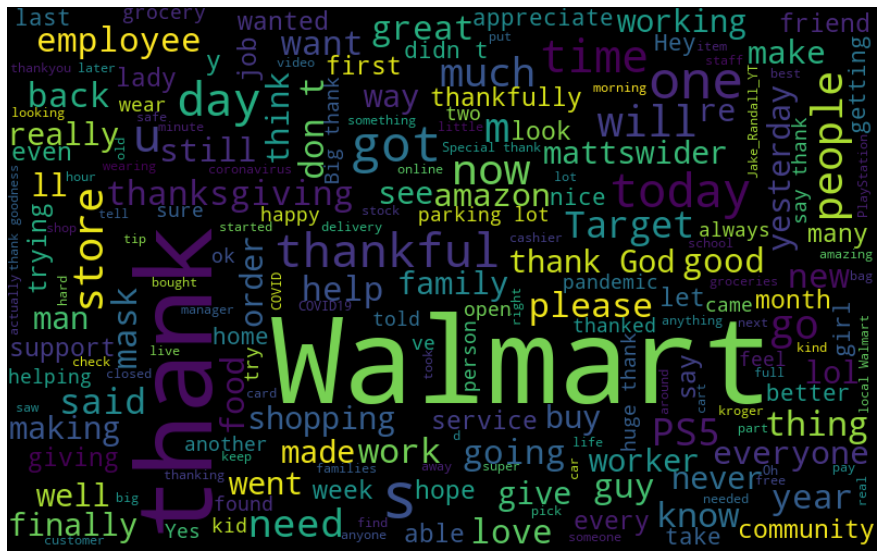

In [ ]:
pd.set_option('max_colwidth', 20)
wal_thank = positive_walmart[positive_walmart["stripped"].str.contains("thank")]

# 1. Import module 
from wordcloud import WordCloud

# 2. Create bag of words for tweets of certain sentiment
all_thank_words = ' '.join([text for text in wal_thank[wal_thank['Sentiment'] == 'Positive']['stripped']])

# 3. Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_thank_words)

# 4. Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [ ]:
print(summarizer(wal_thank, 'p'))

However thanks to the tips today, I was able to get a ps5 bundle from GameSpot, thank thank you!!!!! belltylerisd Walmart Bellvirtualspiritweek thankfulteacher .Don’t know who sent us a frisbee in the mail from Walmart, but Luna says thank you..NHLBruins Walmart Black, Scarano, 11’ thank you!! I mean I’ve tried Target,Best Buy, Amazon,Gamestop I was about to break down and buy one off StockX for a lil more but thank god I didn’t 😂.Dubukat thanks!! We owe them every bite of food we eat, TP, diapers, tools, anything you get from Walmart, Home Depot, grocery store! PS5 thanks, TheSiteSupply Walmart.ps5drop PS5StockAlerts PS5StockTracker spieltimes Wario64 Walmart thank you!!!!! Please let me know - thanks!.36 hours awake, 6 in-stock alert sites/Twitter pages, 3 false rumors, 2 Java Monsters, a Large Coffee, and an espresso shot later... !.imma just recommend one thing, a panini press, nothing fancy, i bought mine 4 years ago at walmart for about $10, but LET ME TELL YOU.


In [ ]:
for i in range(1249,1244, -1):
    print(wal_thank.date.iloc[i], wal_thank.stripped.iloc[i]) 
    print('\n')

2020-03-02 22:48:25+00:00 This is my local Walmart’s bleach aisle after just 1 confirmed NH case of Covid_19 Only 6 deaths in the country and thanks to the media treating it like a panic in the US, they’ve done what they set out to do.mediahoax coronavirus FakeNews 


2020-03-03 01:32:32+00:00 The run on hand sanitizer has taken out Target, Walmart and soon Bath Body Works. Stopped here to grab some for me my sister who can’t get to a mall as easy.If you can get to yours, they’re 5 for $7 while they last. All thanks to the coronavirus. Stay healthy my friends! 


2020-03-03 15:28:40+00:00 Mr. Rubio. You would make a fantastic Walmart mgr. Maybe a district mgr! Jump on it. VoteBlueNoMatterWho and thanks for your service. 


2020-03-04 16:37:21+00:00 justshelbyg Aww thank you!!! Hopefully after May I’ll be done with Walmart 😭😂


2020-03-04 23:30:55+00:00 PSA: it’s not illegal or wrong to say “no thank you” when the Walmart lady asks for your receipt.




In [ ]:
print(summarizer(wal_thank[wal_thank.content.str.contains('got')], 'p'))

I got the playstation I ordered from you guys, thanks!.Walmart Ordered my series x from yall Thursday, got it sunday thank you! It’s so cute!” I got all excited and was like “Walmart!!! !”.PS5StockUpdates Walmart PS5StockUpdates thanks to you I got one thanks so much .I got a thank you for your service from a customer at. Still need 2 more, but you have now helped with 3, one from Best Buy, Walmart and now the Playstation store .CoachJSon Wow, thanks so much Jason! It was a nightmare urgently toggling online between Microsoft, Best Buy, Target, Walmart, GameStop, and Amazon. i got it at walmart for under $20 when they had their halloween section :,).Lbabinz thank you very much for your updates!! You gotta pay a premium, but your butt will thank you later..tpoole00 No I’m gonna pick that up at Walmart soon lol thanks for the suggestion!


In [ ]:
print(summarizer(wal_thank[wal_thank.content.str.contains('thank you')], 'p'))

A huge thank you goes out to our event sponsors: H-E-B, Big 2 News - KMID, NewsWest 9, Walmart Odessa - NW Loop… .namastebreya thank you, thank you!!! However thanks to the tips today, I was able to get a ps5 bundle from GameSpot, thank thank you!!!!! honestly thank you so much!.EatinLikeReptar Yeah i just used fujifilm 400 from Walmart , but thank you man !.kroger DillonsGrocery hey I love click list thank you. Only got one comment - a thumbs up and a “thank you - I’m so exhausted!”😃RidenWithBiden Biden2020 .thehoneypotcomp KingDri Walmart Walgreens kroger Vitacost LuckyVitamin aweeee thank you!! 😆.PSA: it’s not illegal or wrong to say “no thank you” when the Walmart lady asks for your receipt..justshelbyg Aww thank you!!! ps5 playstation5 hype happy luckyaf sony playstation nerd thank you walmart walmart dis.pops thefutureishere nextgeneration Imperial, Pennsylvania .Well it’s coming today walmart thank you!! ❤ .slimmcain _makaflaka Walmart 👌🏾 your hole will thank you 😂.SenSanders Mr

It looks like many of the positive tweets that inculdue the word thank are related to buying a playstation 5. There is also evidence that many tweets with the phrase "thank you" is related to walmart's donation and sponsorship habits. 

## Negative Walmart  Noun Chunks

In [ ]:
negative_walmart = tweets[tweets['Sentiment']== "Negative"]

In [ ]:
nlp = spacy.load("en_core_web_sm")

# 1. Find Noun Chunks in each tweet (apply lambda function to each tweet that returns list of noun chunks) - This is computationally expensive and can take a while...
negative_walmart['NounChunks'] = negative_walmart.stripped.apply(lambda x:  list(str(y) for y in (nlp(x).noun_chunks)))

In [ ]:
# Import necessary packages and modules
import spacy
import string

import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

le = WordNetLemmatizer()
cached_stopwords = stopwords.words('english')

# 2. Clean-up Function
'Function that goes through a column of noun chunks (i.e., column of lists) and cleans each noun chunk (i.e., list item) separately'
def cleanNouns(chunk_list):
    return_list = []
    for chunk in chunk_list:
        chunk = ''.join(i for i in str(chunk) if i in string.printable)
        chunk =[t for t in word_tokenize(chunk.lower()) if t not in cached_stopwords]
        chunk = [le.lemmatize(t) for t in chunk] 
        chunk = " ".join(chunk)
        chunk = chunk.strip()
        if chunk != '': 
            return_list.append(chunk)
    return return_list

# 3. Clean Chunks
negative_walmart['Chunks'] = negative_walmart.NounChunks.apply(lambda x: cleanNouns(x))

# 4. Check our work ---> What do you notice?
negative_walmart[['content','NounChunks', 'Chunks']].tail()

[nltk_data] Downloading package punkt to /Users/reshea/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/reshea/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/reshea/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
/Users/reshea/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,content,NounChunks,Chunks
165805,Y’all so whoever...,"[whoever, my pho...","[whoever, phone ..."
165806,Went to Walmart ...,"[Walmart, my min...","[walmart, mini, ..."
165807,Me last night at...,"[Me, 8pm, : hey ...","[8pm, : hey wydh..."
165810,Mells banned fro...,"[Mells, Walmart]","[mells, walmart]"
165811,Not much excitem...,[Not much excite...,[much excitement...


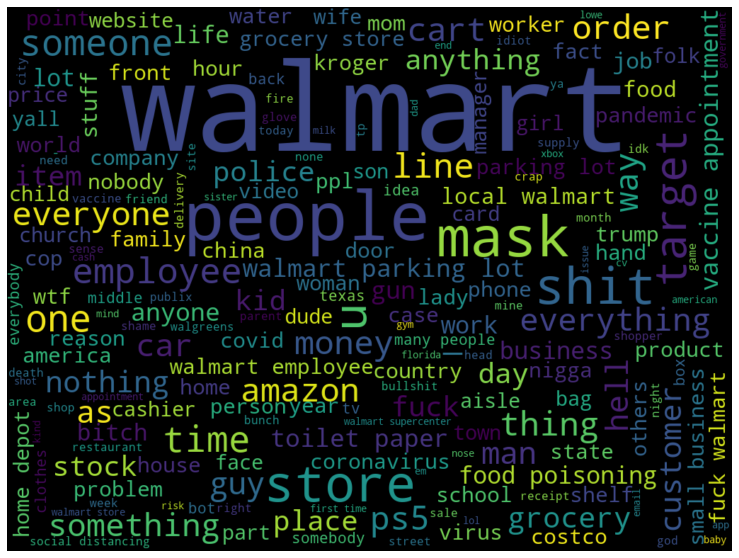

In [ ]:
import itertools

# 1. Set filters what we want to create a word cloud for
SelectSent='Negative'
nchunks = list(itertools.chain.from_iterable(negative_walmart.Chunks[(negative_walmart.Sentiment==SelectSent)]))

# 2. Convert it to dictionary with values and its occurences
from collections import Counter
word_could_dict=Counter(nchunks)

# 3. Now create a word cloud based on Noun Chunks
from wordcloud import WordCloud
wordcloud = WordCloud(width = 1024, height = 768).generate_from_frequencies(word_could_dict)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [ ]:
type(nchunks)

list

In [ ]:
wal_fp = negative_walmart[negative_walmart["stripped"].str.contains("food poisoning")]

In [ ]:
summarizer(wal_fp, 'n')

"Just myself, I'... Food Poisoning .Walmart - Longview, Washington - Rotten grapes One person got food poisoning. 💀💀💀 Just got over horrible food poisoning from those bastards.Walmart - Titusville, Florida - I ended up with severe food poisoning from their hot deli food. Food Poisoning .Walmart - Richmond, Virginia - Possible food poisoning? We use to have one here and people got food poisoning from them..Walmart - Monroe, Washington - This is the second time this has happened to me. I drank again afte... Food Poisoning .Walmart - Roseburg, Oregon - Green grapes made me very sick! 'WARNING': Canadian meat product whose brand sold at Walmart and Costco as well as Metro, Sobeys and Loblaws recalled due to food poisoning concerns via BmptGuardian. .IncognicoV3 I’m be gotten food poisoning from Walmart so many times I just made a restraining order for myself."

In [ ]:
wal_police = negative_walmart[negative_walmart["stripped"].str.contains("police")]
summarizer(wal_police, 'n')

'They then refused her attempt to pay and called the police, according to the lawsuit." She got caught shoplifting, offered to pay, Walmart refused, and calls the police on her for $14, that\'s bullshit. .If Walmart security guards, dentists, pilots, Uber drivers, or nightclub bouncers regularly killed people like police officers do we\'d shut the whole operation down. Being at the White House regularly, it\'s usual, But today, a police officer was walking south on 1st w/ his partner, holding a machine gun. Neither her nor her son heard anything while inside, but when they came outside she mentioned all the police cars, helicopters, police take and tarp covering the body. Easy to start, hard to win..“If you take a car through a Walmart, there’s going to be a lot of damage,” a police official told Channel 9. They will not stay in a city that do not have police to stop the lawless Walmart, target, Costco, they will leave.'

# Kroger

## Processing Tweets

In [ ]:
pd.set_option('max_colwidth', 20)
tweets = pd.read_json('/content/kroger.json', lines=True)

In [ ]:
# Set-up patterns to be removed fro the tweets
pat1 = r"http\S+"
pat2 = r"#"
pat3 = r"@"
pat4 = r"FAV"
pat5 = r"RE"
pat6 = r"pic.\S+"
pat7 = r"\n"
pat8 = '\r\n'
pat9 = r'|'.join((r'&amp;',r'&copy;',r'&reg;',r'&quot;',r'&gt;',r'&lt;',r'&nbsp;',r'&apos;',r'&cent;',r'&euro;',r'&pound;'))
# Combine all patterns
combined_pat = r'|'.join((pat1, pat2, pat3, pat4, pat5, pat6, pat7, pat8, pat9))

# replace the patterns with an empty string
tweets['stripped'] =  [re.sub(combined_pat, '', w) for w in tweets.content]

# might have double spaces now (because of empty string replacements above) - remove double empty spaces
tweets['stripped']  = [re.sub(r"  ", ' ', w) for w in tweets.loc[:,'stripped']]

In [ ]:
# Instantiate the sentiment analyzer (if you haven't already done so)
analyser = SentimentIntensityAnalyzer()

# Now get the compound sentiment score for each tweet
tweets['C_Score'] = np.nan
for index, row in tweets.iterrows(): 
    tweets.loc[index, 'C_Score'] = analyser.polarity_scores(row['stripped'])['compound']

In [ ]:
# create new column
sentiment = []

# Loop through rows of dataframe and determine strings for new column "Sentiment"
for index, row in tweets.iterrows(): 
    if tweets.loc[index, 'C_Score'] > 0.05 : 
        sentiment.append("Positive")      
    elif tweets.loc[index, 'C_Score'] < -0.05 :
        sentiment.append("Negative")    
    else :
        sentiment.append("Neutral")    

tweets['Sentiment'] = sentiment
tweets['Sentiment'] = tweets['Sentiment'].astype("category")

## Sentiment Distribution

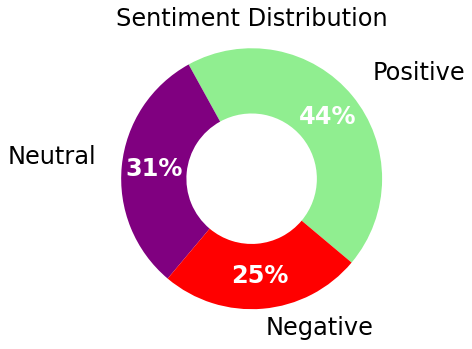

In [ ]:
# import necessary modules (if not already imported)
import matplotlib.pyplot as plt

# Set font size
plt.rcParams['font.size']=24

# Define figure
fig, ax = plt.subplots(figsize=(9, 6), subplot_kw=dict(aspect="equal"))

# Get count by sentiment category from tweets_df
sentiment_counts = tweets.Sentiment.value_counts()
labels = sentiment_counts.index

# Define colors
color_palette_list = ['lightgreen', 'purple', 'red','orange']

# Generate graph components
wedges, texts, autotexts = ax.pie(sentiment_counts, wedgeprops=dict(width=0.5), startangle=-40,  
       colors=color_palette_list[0:3], autopct='%1.0f%%', pctdistance=.75, textprops={'color':"w", 'weight':'bold'})

# Plot wedges
for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    ax.annotate(labels[i], xy=(x, y), xytext=(1.2*x, 1.2*y),
                horizontalalignment=horizontalalignment)
# Set title
ax.set_title("Sentiment Distribution", y=.95, fontsize = 24)

# Show Donut Chart
plt.show()

## Text Summarizer

In [ ]:
def summarizer(df, pn):
    if pn == 'n':
        return negativeSummary(df)
    if pn == 'p': 
        return positiveSummary(df)
    else: 
        return "If positive enter p, if negative enter n"

# Used code from stackabuse.com
def negativeSummary(df):
    sentences = ""
    for x in df[df['Sentiment'] == 'Negative']['stripped']: 
        sentences += (str(x)+".")
    sentence_list = nltk.sent_tokenize(sentences)
    stopwords = nltk.corpus.stopwords.words('english')
    word_frequencies = {}
    for word in nltk.word_tokenize(sentences):
        if word not in stopwords:
            if word not in word_frequencies.keys():
                word_frequencies[word] = 1
            else:
                word_frequencies[word] += 1
    maximum_frequncy = max(word_frequencies.values())
    for word in word_frequencies.keys():
        word_frequencies[word] = (word_frequencies[word]/maximum_frequncy)
    sentence_scores = {}
    for sent in sentence_list:
        for word in nltk.word_tokenize(sent.lower()):
            if word in word_frequencies.keys():
                if len(sent.split(' ')) < 30:
                    if sent not in sentence_scores.keys():
                        sentence_scores[sent] = word_frequencies[word]
                    else:
                        sentence_scores[sent] += word_frequencies[word]
    summary_sentences = heapq.nlargest(7, sentence_scores, key=sentence_scores.get)
    summary = ' '.join(summary_sentences)
    return summary

# Used code from stackabuse.com
def positiveSummary(df):
    sentences = ""
    for x in df[df['Sentiment'] == 'Positive']['stripped']: 
        sentences += (str(x)+".")
    sentence_list = nltk.sent_tokenize(sentences)
    stopwords = nltk.corpus.stopwords.words('english')
    word_frequencies = {}
    for word in nltk.word_tokenize(sentences):
        if word not in stopwords:
            if word not in word_frequencies.keys():
                word_frequencies[word] = 1
            else:
                word_frequencies[word] += 1
    maximum_frequncy = max(word_frequencies.values())
    for word in word_frequencies.keys():
        word_frequencies[word] = (word_frequencies[word]/maximum_frequncy)
    sentence_scores = {}
    for sent in sentence_list:
        for word in nltk.word_tokenize(sent.lower()):
            if word in word_frequencies.keys():
                if len(sent.split(' ')) < 30:
                    if sent not in sentence_scores.keys():
                        sentence_scores[sent] = word_frequencies[word]
                    else:
                        sentence_scores[sent] += word_frequencies[word]
    summary_sentences = heapq.nlargest(7, sentence_scores, key=sentence_scores.get)
    summary = ' '.join(summary_sentences)
    return summary

## Negative Word Cloud Analysis

In [ ]:
# Dataframe of tweets with negative sentiment 
negative_kroger = tweets[tweets['Sentiment']== "Negative"]

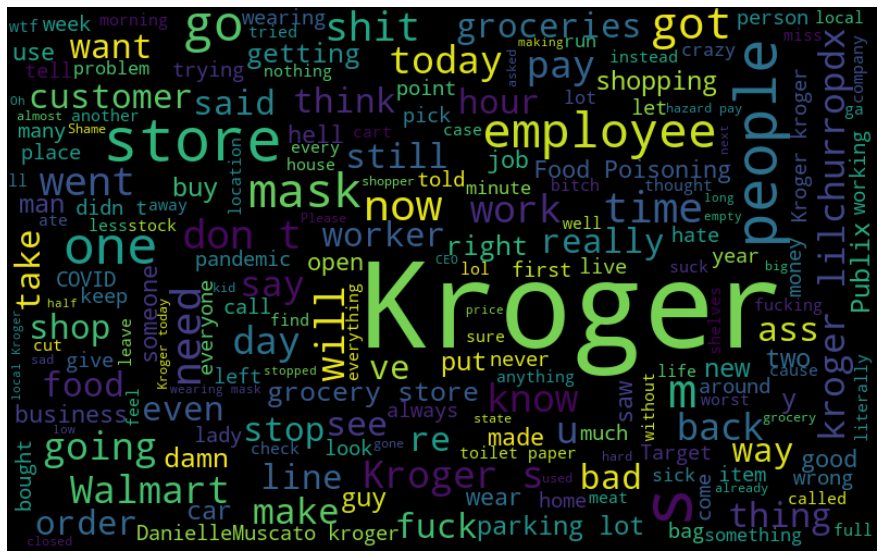

In [ ]:
# 1. Import module 
from wordcloud import WordCloud

# 2. Create bag of words for tweets of certain sentiment
all_neg_words = ' '.join([text for text in tweets[tweets['Sentiment'] == 'Negative']['stripped']])

# 3. Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_neg_words)

# 4. Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

Words of interest: 

In [ ]:
neg_words = ['employee', 'people', 'groceries', 'customer', 'go', 'today', 'time']

## Kroger Negative Noun Chunk

In [ ]:
nlp = spacy.load("en_core_web_sm")

# 1. Find Noun Chunks in each tweet (apply lambda function to each tweet that returns list of noun chunks) - This is computationally expensive and can take a while...
negative_kroger['NounChunks'] = negative_kroger.stripped.apply(lambda x:  list(str(y) for y in (nlp(x).noun_chunks)))

# 2. Check our work:
negative_kroger[['content','NounChunks']].tail()

# Import necessary packages and mod

le = WordNetLemmatizer()
cached_stopwords = stopwords.words('english')

# 2. Clean-up Function
'Function that goes through a column of noun chunks (i.e., column of lists) and cleans each noun chunk (i.e., list item) separately'
def cleanNouns(chunk_list):
    return_list = []
    for chunk in chunk_list:
        chunk = ''.join(i for i in str(chunk) if i in string.printable)
        chunk =[t for t in word_tokenize(chunk.lower()) if t not in cached_stopwords]
        chunk = [le.lemmatize(t) for t in chunk] 
        chunk = " ".join(chunk)
        chunk = chunk.strip()
        if chunk != '': 
            return_list.append(chunk)
    return return_list

# 3. Clean Chunks
negative_kroger['Chunks'] = negative_kroger.NounChunks.apply(lambda x: cleanNouns(x))

# 4. Check our work ---> What do you notice?
negative_kroger[['content','NounChunks', 'Chunks']].tail()

import itertools

# 1. Set filters what we want to create a word cloud for
SelectSent='Negative'
nchunks = list(itertools.chain.from_iterable(negative_kroger.Chunks[(negative_kroger.Sentiment==SelectSent)]))

# 2. Convert it to dictionary with values and its occurences
from collections import Counter
word_could_dict=Counter(nchunks)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


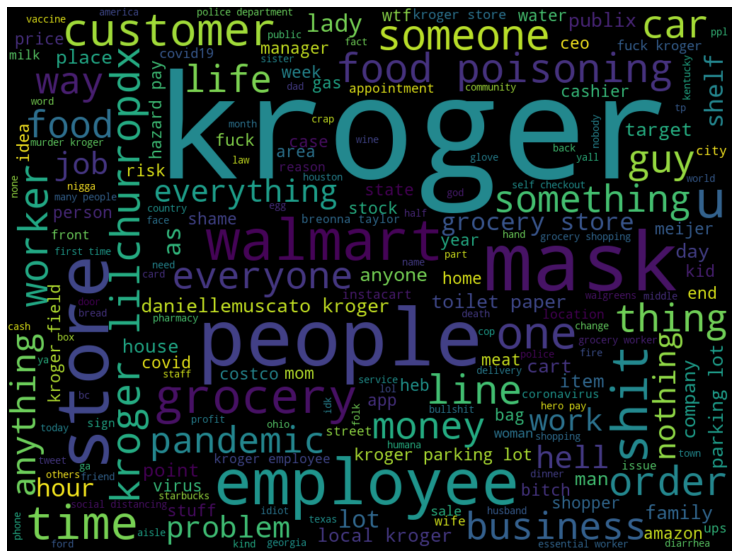

In [ ]:
# 3. Now create a word cloud based on Noun Chunks
from wordcloud import WordCloud
wordcloud = WordCloud(width = 1024, height = 768).generate_from_frequencies(word_could_dict)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

### Analyzing Negative Tweets that include "Food Poisoning"

In [ ]:
krog_fp = negative_kroger[negative_kroger["stripped"].str.contains("food poisoning")]

In [ ]:
summarizer(krog_fp, 'n')

"!.Kroger - Centerville, Ohio - I bought some sushi and it gave me food poisoning. Ok, as a Texan, I feel I should weigh in on the Blue Bell thing, but I was gone for the big recall. Then I called and spoke to a customer service person and they said they can’t do a... Food Poisoning . .Not me getting food poisoning from Kroger rotisserie chicken. I hate food poisoning; it sucks hard. I think I'm more concerned about food poisoning than a virus. PR?.kroger At 8745 S Emerson Ave, Indianapolis IN."

### Analyzing Negative Tweets that include "employee"

In [ ]:
krog_people = negative_kroger[negative_kroger["stripped"].str.contains("employee")]
summarizer(krog_people, 'n')

"Greedy basterds..I have been shoulder checked, physically blocked from entering, chased by employees, yelled at by employees, shamed by employees, etc at Kroger, Meijer, USPS, more. It’s dirty, people always begging for money, carts everywhere in the parking lot, trash EVERYWE inside out, rude employees, now this - great way to represent our flag. U guys need to start paying your employees hazard pay, don’t say u can’t afford it, you’re making lots lots of money, just look how empty your selves are. AL, FL, GA, NC, SC, VA, TN. 😳.Kroger mandate masks, in a state that mandates masks, or lose customers and employees!.The Clifton neighborhood association is thanking employees at the Clifton kroger in Louisville. .Kroger employees will get to keep their ‘Hero Pay’ after all, after some employees received letters ⬇️ saying they’d been overpaid would have to pay it back. But if you're going to threaten a poor Kroger employee, or similar, over such things, I don't like you, Karen."

### Analyzing Negative Tweets that include "customer"

In [ ]:
krog_customer = negative_kroger[negative_kroger["stripped"].str.contains("customer")]
summarizer(krog_customer, 'n')

'....Kroger mandate masks, in a state that mandates masks, or lose customers and employees!.The cashier, bagger customer in front of me all had their nose exposed. Mask mandate lifted and while Kroger still requires employees, vendors, and customers to wear a mask while in the store there was at least 15 customers not wearing one. Losing a few stubborn customers is better than losing a few thousand at each location!.Hoping HEB, kroger, and Target, does the right thing in Texas. Horrible customer service I tell ya..I guarantee that NO farmer, farmers market worker, farmers market manager, or anyone else within farm to customer food chain is contemplating stock options. .kroger it’s not just your Breckinridge KrogerNews it’s everywhere y’all offer “click list pick up” - it’s a nightmare for the customers and your employees. Dystopian .If this person is the “best” Kroger has, by harassing customers for buying 2 cases of water in the middle of a state crisis, shame on them all. (Not the fi

### Analyzing Negative Tweets that include "stock"

In [ ]:
krog_stock = negative_kroger[negative_kroger["stripped"].str.contains("stock")]
summarizer(krog_stock, 'n')

".I went to the grocery store today, and it only took me four hours, two changes of clothes, a load of laundry, a shower and a highly-skilled decontamination procedure. WJTV .I guarantee that NO farmer, farmers market worker, farmers market manager, or anyone else within farm to customer food chain is contemplating stock options. (And you are Frys).Coronavirus National Emergency: When Will Walmart, Kroger, Other Stores Restock .geoff_calkins I worry about my grocery lady, Ms Shirley. I eat them for lunch everyday!.esoteric_dior I’m calling the head of Kroger, or Genuardi's, or wherever the hell you shop and asking them ration that shit. abc13 .Stock market is going to shit, Kroger’s warehouses are running out of food because everyone is stockpiling everything, the schools are shutting down. Not all heroes wear capes.stoolpresidente Yo, DDT...After a terrible 4 year run, today I said sayonara to my Under Armour stock and hello to Kroger Grocery Chain. $Kroger profit:2021 = 30.9 billion2

In [ ]:
krog_stock.date = pd.to_datetime(krog_stock.date)
krog_stock['Date'] = [x.date() for x in krog_stock['date']]
krog_stock['month'] = [x.month for x in krog_stock['date']]
krog_stock_time= krog_stock.groupby(['Date', 'month']).count()
krog_stock_time = krog_stock_time.reset_index()[['Date','month', 'content']]

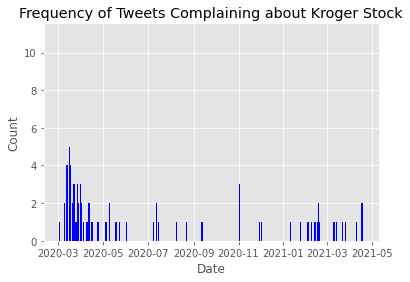

In [ ]:
import datetime as dt
plt.style.use('ggplot')
plt.bar(krog_stock_time['Date'], krog_stock_time['content'], color='blue', align='edge')
plt.title('Frequency of Tweets Complaining about Kroger Stock')
plt.xlabel("Date")
plt.ylabel("Count")
plt.savefig('krog_stock.png', dpi=95)
plt.show()

## Positive Noun Chunk Analysis

In [ ]:
positive_kroger = tweets[tweets['Sentiment']=='Positive']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


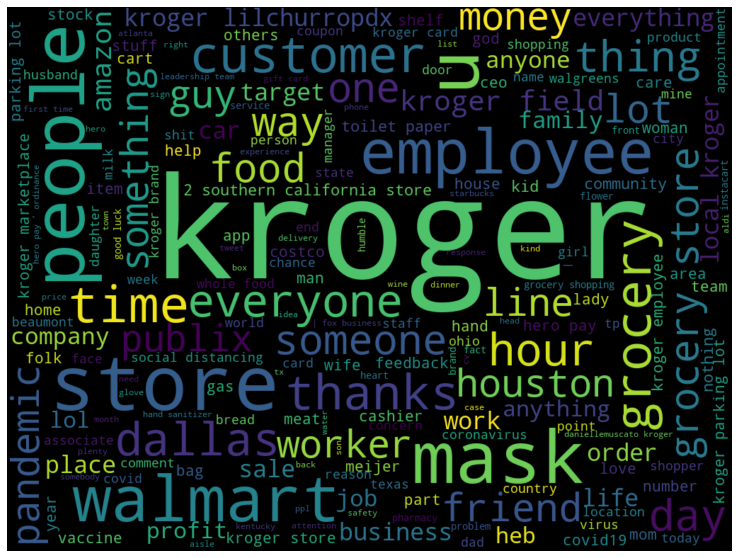

In [ ]:
nlp = spacy.load("en_core_web_sm")

# 1. Find Noun Chunks in each tweet (apply lambda function to each tweet that returns list of noun chunks) - This is computationally expensive and can take a while...
positive_kroger['NounChunks'] = positive_kroger.stripped.apply(lambda x:  list(str(y) for y in (nlp(x).noun_chunks)))

# 2. Check our work:
positive_kroger[['content','NounChunks']].tail()

# Import necessary packages and mod

le = WordNetLemmatizer()
cached_stopwords = stopwords.words('english')

# 2. Clean-up Function
'Function that goes through a column of noun chunks (i.e., column of lists) and cleans each noun chunk (i.e., list item) separately'
def cleanNouns(chunk_list):
    return_list = []
    for chunk in chunk_list:
        chunk = ''.join(i for i in str(chunk) if i in string.printable)
        chunk =[t for t in word_tokenize(chunk.lower()) if t not in cached_stopwords]
        chunk = [le.lemmatize(t) for t in chunk] 
        chunk = " ".join(chunk)
        chunk = chunk.strip()
        if chunk != '': 
            return_list.append(chunk)
    return return_list

# 3. Clean Chunks
positive_kroger['Chunks'] = positive_kroger.NounChunks.apply(lambda x: cleanNouns(x))

# 4. Check our work ---> What do you notice?
positive_kroger[['content','NounChunks', 'Chunks']].tail()

import itertools

# 1. Set filters what we want to create a word cloud for
SelectSent='Positive'
nchunks = list(itertools.chain.from_iterable(positive_kroger.Chunks[(positive_kroger.Sentiment==SelectSent)]))

# 2. Convert it to dictionary with values and its occurences
from collections import Counter
word_could_dict=Counter(nchunks)

# 3. Now create a word cloud based on Noun Chunks
from wordcloud import WordCloud
wordcloud = WordCloud(width = 1024, height = 768).generate_from_frequencies(word_could_dict)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [ ]:
krog_pos_words = ['people', 'mask', 'grocery', 'grocery store', 'thanks', 'customer', 'dallas',
                 'employee', 'business', 'target', 'food', 'money']

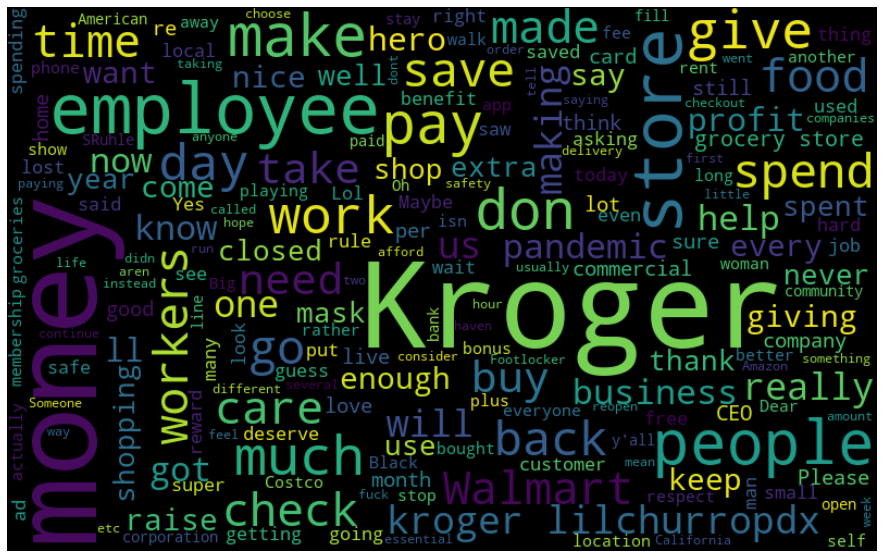

In [ ]:
# 1. Import module 
from wordcloud import WordCloud

krog_money = positive_kroger[positive_kroger["stripped"].str.contains("money")]
# 2. Create bag of words for tweets of certain sentiment
all_pos_words = ' '.join([text for text in krog_money[krog_money['Sentiment'] == 'Positive']['stripped']])

# 3. Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_pos_words)

# 4. Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

### Analyzing Positive Tweets that include "money"

In [ ]:
summarizer(krog_money, 'p')

'For folks who really NEED MONEY TO FEED THEIR FAMILY, pay bills,,, those are open jobs. That\'s their "profit strategy"..dshitpostings the_cancel_mob socialistdogmom kroger lilchurropdx I feel like money spent on buybacks should be treated differently than money spent on, I dunno, paying workers. You too, kroger .kroger Dear kroger -why are you helping the Oath Keepers, a far right, anti government militia group, raise money? You’re just about the money, u could make it safer, but u choose not to!.Saw this at my local corner store today. Money wins every time in every part of sports!.me: I need to save money, kroger salad kits, instant ramen and boiled eggs with toast for me! Show them some money!.grayhoodie lilchurropdx kroger Nah, they\'d rather use the money to buy mansions. Kroger, winco, Walmart, Lowe’s etc!!!'

In [ ]:
for i in range(5):
    print(krog_money.date.iloc[i], krog_money.content.iloc[i]) 
    print('\n')

2021-04-19 23:41:38+00:00 @RandPaul Funny coming out with this after you have lost control.
Also funny come from the GOP who agreed to let the Sec of Treasury self determine who received $500M in stimulus money.
I am in agreement to stop wasteful spending. Just don’t act like the Dems are the only guilty party.


2021-04-19 23:31:11+00:00 @Rawwwb1 @kroger @lilchurropdx They made $79,908 in profit per month per location. I am sure some lost money and many made more. Or better put $2,627 per day, per location. In 2019 they made 2.2% profit per store. That is fairly normal.


2021-04-19 23:12:51+00:00 @kroger maybe invest your money better. https://t.co/dxKjFlIpfT


2021-04-19 23:12:24+00:00 @carloslikestoh1 @kroger @lilchurropdx Ah yes, the retired teachers will starve if we don't bilk the grocery store workers out of a decent day's pay. Pitting middle class workers against each other while the money keeps flowing upwards. You're doing God's work, truly.


2021-04-19 23:11:29+00:00 @krog

In [ ]:
krog_mon_care = krog_money[krog_money['content'].str.contains('care')]
summarizer(krog_mon_care, 'p')

'Take care of your employees don’t just give them a raise for a month, don’t be PATHETIC!. They don’t actually care about their employees, they care about the money!I guess their CEO is their hero.This is disgusting. I don’t live near any kroger, but I’m certainly never shopping at one ever again nor would I encourage anyone to work for them. I guess they dont care about their employees and only care about the money they make..bj_erngren cnnbrk kroger I hope I get the opportunity to patronize them. Greedy corporations just care about the money, and Kroger showed their true intent. It’s refreshing to see a company that cares and will spend money doing it. Kudos to kroger.JuddLegum kroger I care kroger.'

In [ ]:
for i in range(5):
    print(krog_mon_care.date.iloc[i], krog_mon_care.content.iloc[i]) 
    print('\n')

2021-04-19 18:04:27+00:00 This is why I don't shop @kroger anymore. Clearly this company doesn't care about its employees during a #Pandemic &amp; should be out of business entirely. I'll continue to shop at my local Super King, doubt they're spending money to buy back stock! #COVID19 https://t.co/jERo8vimL8


2021-04-17 06:30:29+00:00 @KTLA Does Kroger miss me? Because I used to spend most of my food budget there, and now I rarely even walk into one. And usually for the Redbox machine.

They made money hand over fist during the pandemic, and they have demonstrated how much they "care" for their essential workers.


2021-04-15 02:20:56+00:00 I like how @Kroger has a mask rule, but dont enforce it 🙄 I would have more respect for Kroger if they just said fuck it and dont have the rule at all. I guess they dont care about their employees and only care about the money they make.


2021-03-03 23:09:06+00:00 @bj_erngren @cnnbrk @kroger I hope I get the opportunity to patronize them.  It’s re

### Analyzing Positive Tweets that include "kroger card"

In [ ]:
krog_card = positive_kroger[positive_kroger["stripped"].str.contains("kroger card")]
print(summarizer(krog_card, 'p'))

Seems like a big step backwards....women only want one thing, and it's my kroger card number.Chris from Warren up a $500 kroger card today! MI_Kroger .they send us coupons based on my purchases which they tracked through our kroger card. they were all 50% off with a kroger card 🙂 our store had so much. I have a $10 kroger card. Plz DM if you're interested..So why can’t I link my kroger card in IbottaApp anymore? You could be next...make sure you are listening at 10 after 8 times a day for your chance to win! FillUpTheSwimmingPool😂 **nightcam doesn't endorse the filing up of swimming pools with free gas.


In [ ]:
for i in range(5):
    print(krog_card.date.iloc[i], krog_card.content.iloc[i]) 
    print('\n')

2021-04-15 21:16:32+00:00 I have a $10 kroger card.  Free. I'd like to get it to someone who needs it. Plz DM if you're interested.


2021-04-01 14:39:09+00:00 So why can’t I link my @kroger card in @IbottaApp anymore? Seems like a big step backwards...


2021-01-28 07:06:08+00:00 women only want one thing, and it's my kroger card number


2020-06-18 15:30:54+00:00 Chris from Warren picked up a $500 @kroger card today!  You could be next...make sure you are listening at 10 after 8 times a day for your chance to win! @MI_Kroger https://t.co/F7MoM1IsF5


2020-06-05 19:49:19+00:00 they send us coupons based on my purchases which they tracked through our kroger card. thanks guys. you're my favorite multi-billion dollar conglomerate 🥰🥰




### Analyzing Positive Tweets that include "membership"

In [ ]:
krog_mem = negative_kroger[negative_kroger["stripped"].str.contains("membership")]
print(summarizer(krog_mem, 'n'))

!.BrunTheBear proviewsusa MightyM55070329 I bought a Kroger discount pharmacy card membership and pay much less than I would using my insurance. Might not pay for the annual membership if I’m missing out on my Kroger points and fuel rewards!.kroger .Instacart.loudspike look into the app Flipp. Ooops!.SamsClub If my family didn't rely on the pharmacy, I would cancel my membership! Getting gas at Kroger this morning and my membership number kept getting rejected. This company continues to raise prices, lower quantities and quality!! If some items could be found at Kroger in bulk, I'd cancel my membership! I wouldn't buy diabetic test strips off ebay.


# Amazon

In [ ]:
amazon = pd.read_csv('/content/gdrive/MyDrive/epsilon1.part3/amazonFinal.csv')

/Users/brooke/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3057: DtypeWarning: Columns (0,1,2,3,4,5,6,7,10,11,12,13,14,15,16,17,18,19,20,21,22) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


Initial cleaning of tweets' content to make it usable for sentiment analysis

In [ ]:
# Set-up patterns to be removed fro the tweets
pat1 = r"http\S+"
pat2 = r"#"
pat3 = r"@"
pat4 = r"FAV"
pat5 = r"RE"
pat6 = r"pic.\S+"
pat7 = r"\n"
pat8 = '\r\n'
pat9 = r'|'.join((r'&amp;',r'&copy;',r'&reg;',r'&quot;',r'&gt;',r'&lt;',r'&nbsp;',r'&apos;',r'&cent;',r'&euro;',r'&pound;'))
# Combine all patterns
combined_pat = r'|'.join((pat1, pat2, pat3, pat4, pat5, pat6, pat7, pat8, pat9))

In [ ]:
# replace the patterns with an empty string - amazon
amazon['content'] = amazon['content'].astype(str)
amazon['stripped'] =  [re.sub(combined_pat, '', w) for w in amazon.content]

In [ ]:
# remove excess columns
amazon = amazon[['date', 'content', 'stripped', 'id', 'user', 'likeCount', 'lang', 'media', 'mentionedUsers', 'coordinates']].copy()

Initializing the sentiment analysis analyzer

In [ ]:
analyser = SentimentIntensityAnalyzer()

# Define a function that returns the polarity score of a sentence
def sentiment_analyzer_scores(sentence):
    score = analyser.polarity_scores(sentence)
    print("{:-<55} {}".format(sentence, str(score)), "\n")

Setting up Sentiment and C Score columns for Amazon tweets

In [ ]:
# Now get the compound sentiment score for each tweet - amazon
amazon['C_Score'] = np.nan
for index, row in amazon.iterrows(): 
    amazon.loc[index, 'C_Score'] = analyser.polarity_scores(row['stripped'])['compound']

In [ ]:
# create new column
sentiment = []

# Loop through rows of dataframe and determine strings for new column "Sentiment"
for index, row in amazon.iterrows(): 
    if amazon.loc[index, 'C_Score'] > 0.05 : 
        sentiment.append("Positive")      
    elif amazon.loc[index, 'C_Score'] < -0.05 :
        sentiment.append("Negative")    
    else :
        sentiment.append("Neutral")    

amazon['Sentiment'] = sentiment
amazon['Sentiment'] = amazon['Sentiment'].astype("category")

In [ ]:
print('Amazon:')
print(f"Count positive tweets: {sum(amazon['C_Score'] > 0.05)}")
print(f"Count netural tweets: {amazon['C_Score'].between(-0.05, 0.05).sum()}")
print(f"Count negative tweets: {sum(amazon['C_Score'] < -0.05)}")
print(f"Total number of tweets: {amazon['C_Score'].count()}")
      
display(amazon.C_Score.describe())

Amazon:
Count positive tweets: 289341
Count netural tweets: 327191
Count negative tweets: 58255
Total number of tweets: 674787


count    674787.000000
mean          0.173005
std           0.354470
min          -0.999400
25%           0.000000
50%           0.000000
75%           0.361200
max           0.999800
Name: C_Score, dtype: float64

Sentiment Distribution for Amazon Tweets

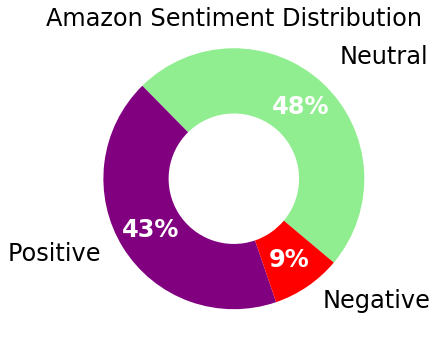

In [ ]:
# Amazon
# Set font size
plt.rcParams['font.size']=24

# Define figure
fig, ax = plt.subplots(figsize=(9, 6), subplot_kw=dict(aspect="equal"))

# Get count by sentiment category from tweets_df
sentiment_counts = amazon.Sentiment.value_counts()
labels = sentiment_counts.index

# Define colors
color_palette_list = ['lightgreen', 'purple', 'red','orange']

# Generate graph components
wedges, texts, autotexts = ax.pie(sentiment_counts, wedgeprops=dict(width=0.5), startangle=-40,  
       colors=color_palette_list[0:3], autopct='%1.0f%%', pctdistance=.75, textprops={'color':"w", 'weight':'bold'})

# Plot wedges
for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    ax.annotate(labels[i], xy=(x, y), xytext=(1.2*x, 1.2*y),
                horizontalalignment=horizontalalignment)
# Set title
ax.set_title("Amazon Sentiment Distribution", y=.95, fontsize = 24)

# Show Donut Chart
plt.show()

Word Cloud of all Amazon Tweets

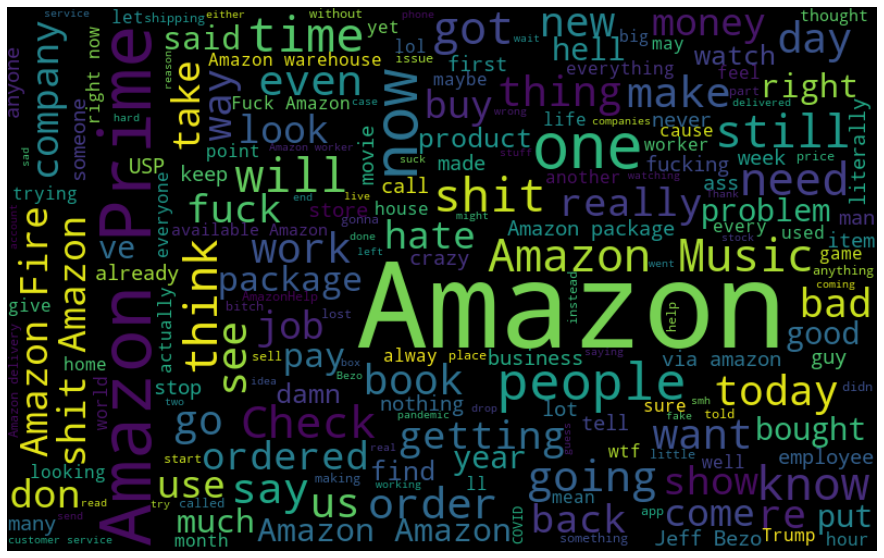

In [ ]:
# Amazon Word Cloud

# Create bag of words for tweets of certain sentiment
all_words = ' '.join([text for text in amazon[amazon['Sentiment'] == 'Negative']['stripped']])

# Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_words)

# Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

Setting up pre-processing to prepare tweets' content for Noun Chunk analysis

In [ ]:
# Set options to remove URL, Reserved word
prepro.set_options(prepro.OPT.URL, prepro.OPT.RESERVED)

# Let's do it for all tweets
amazon['content'] = amazon['content'].astype(str)
amazon['text']  = amazon['content'].apply(prepro.clean)

# Check our work
amazon['text'].tail(5)

603530                    @ikirker No, it was $10 at Target
603531                       A look at Target. Snoke! Sigh.
603532                         Shopping at target is a date
603533    Btw, in case any of y’all want/need full sized...
603534    My Bucket List: - Visit where Jurassic was fil...
Name: text, dtype: object

In [ ]:
# Replace html &amp; with and
amazon['text'] =  [re.sub(r'&amp;', 'and', w) for w in amazon.text]

# Remove other html entities 
htmlents = r'|'.join((r'&copy;',r'&reg;',r'&quot;',r'&gt;',r'&lt;',r'&nbsp;',r'&apos;',r'&cent;',r'&euro;',r'&pound;')) 
amazon['text'] =  [re.sub(htmlents, '', w) for w in amazon.text]

# Notice that Hashtags and Mentions are still in the tweets. Sometimes, we may want to treat them as nouns (e.g., for a brand or person)
# To do so, we need to remove the special characters # and @ using regular expressions

# Set-up patterns to be removed fro the tweets
htag = r'|'.join((r"#", r"@"))

# Now, replace the patterns with an empty string
amazon['text'] =  [re.sub(htag, '', w) for w in amazon.text]

# We might have double spaces now (because of empty string replacements above) - remove double empty spaces
#tweets['stripped']  = [re.sub(r"  ", ' ', w) for w in tweets.loc[:,'stripped']]
amazon['text'] = amazon.text.replace({' +':' '},regex=True)

# Check our Work
amazon['text'].tail(5)

674783    Coulson2020 It occurred to me that a lot of th...
674784    Yes it DOES...and WE OWE TO MAGA TALK HARD Che...
674785        lovelyyyjay Running to Amazon this second lol
674786    AmazonHelp SupriyaSurender Pass mine along too...
674787    Boot for your foot from the doctor, hoping ins...
Name: text, dtype: object

Grabbing all negative tweets to create a new dataframe to use for Noun Chunking analysis

In [ ]:
# Load English language Model
nlp = spacy.load('en')
a_neg = amazon[amazon['Sentiment'] == 'Negative']

In [ ]:
a_neg['Noun Chunks'] = a_neg.text.apply(lambda x:  list(str(y) for y in (nlp(x).noun_chunks)))
a_neg[['content', 'Noun Chunks']].tail()

In [ ]:
import string
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

le = WordNetLemmatizer()
cached_stopwords = stopwords.words('english')

# Clean-up Function that goes through a column of noun chunks (i.e., column of lists) and cleans each noun chunk (i.e., list item) separately
def cleanNouns(chunk_list):
    return_list = []
    for chunk in chunk_list:
        chunk = ''.join(i for i in str(chunk) if i in string.printable)
        chunk =[t for t in word_tokenize(chunk.lower()) if t not in cached_stopwords]
        chunk = [le.lemmatize(t) for t in chunk] 
        chunk = " ".join(chunk)
        chunk = chunk.strip()
        if chunk != '': 
            return_list.append(chunk)
    return return_list

In [ ]:
a_neg.rename(columns = {'Noun Chunks' : 'NounChunks'}, inplace = True)

In [ ]:
# Clean Chunks
a_neg['Chunks'] = a_neg['NounChunks'].apply(lambda x: cleanNouns(x))

Word Cloud of all negative Amazon tweets

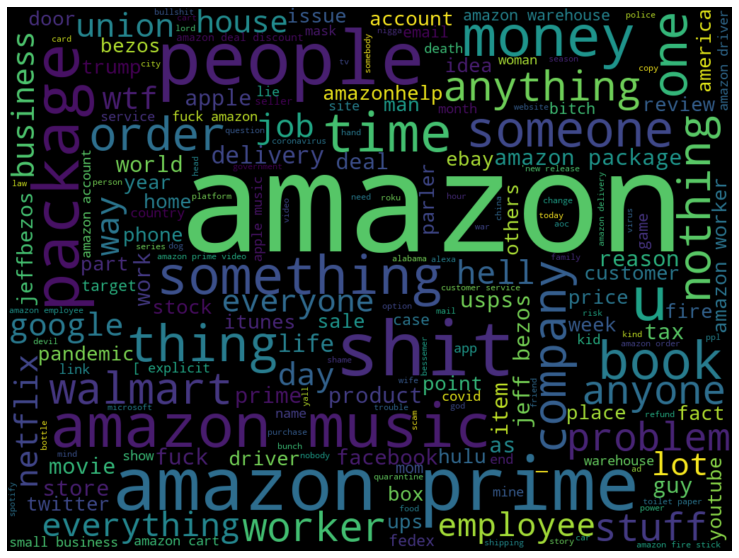

In [ ]:
# Amazon Noun Chunks Vis
nchunks = list(itertools.chain.from_iterable(a_neg.Chunks))

# Convert it to dictionary with values and its occurences
word_cloud_dict=Counter(nchunks)

# Now create a word cloud based on Noun Chunks
wordcloud = WordCloud(width = 1024, height = 768).generate_from_frequencies(word_cloud_dict)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

During our EDA, we found that Walmart had lots of problems with stocking during the Covid Crisis. We decided to compare this to other companies, so we are going to focus on negative tweets mentioning 'stock'.

In [ ]:
stock_mention = []
for index, row in a_neg.iterrows():
  if 'stock' in row['StringChunks']:
    stock_mention.append(1)
  else:
    stock_mention.append(0)
a_neg['stock_mention'] = stock_mention
a_neg['date'] = pd.to_datetime(a_neg['date'])

In [ ]:
str_chunks = []
for x in a_neg['Chunks']:
  str_chunks.append(''.join(x))

a_neg['StringChunks'] = str_chunks
# a_neg.drop('Unnamed: 0', axis=1, inplace=True)

The following word cloud shows negative Amazon tweets that contain the word 'stock'

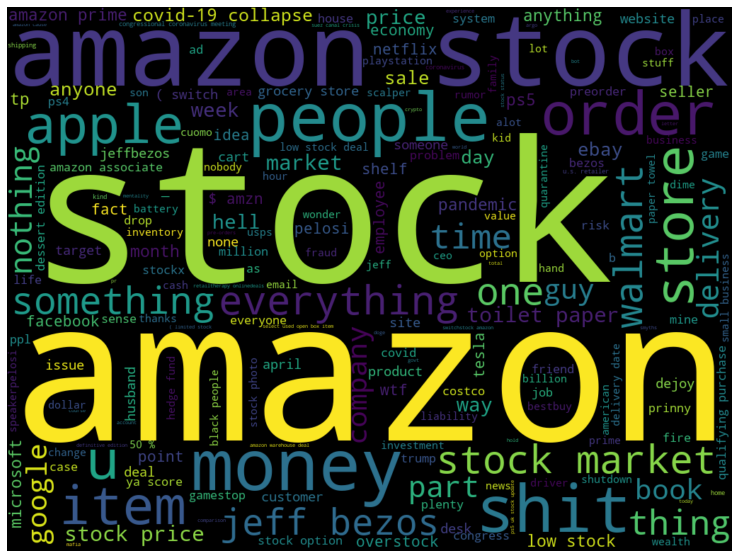

In [ ]:
# Amazon charges for a membership fee for Prime shipping, but many complaints about bad shipping times/results even with fee
# Amazon did not suspend or lighten membership fees during peak of pandemic when the shipping times were terrible and many in-demand products out of stock
# Ex. index 432951, 634782
pd.set_option('max_colwidth', 250)
a_neg_p = a_neg[a_neg['StringChunks'].str.contains('stock')]

# Amazon 'Problem' Noun Chunks Vis
nchunks = list(itertools.chain.from_iterable(a_neg_p.Chunks))

# Convert it to dictionary with values and its occurences
word_cloud_dict=Counter(nchunks)

# Now create a word cloud based on Noun Chunks
wordcloud = WordCloud(width = 1024, height = 768).generate_from_frequencies(word_cloud_dict)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

The following graph maps Twitter complaints about stocking from March 2020 to April 2021

In [ ]:
import datetime as dt

dates = a_neg_p['date'].dt.date.unique()
tweets = []
for d in dates:
  temp = a_neg_p[a_neg_p['date'].dt.date == d]
  tweets.append(sum(temp['stock_mention']))

stock_a = pd.DataFrame({'date': dates, 'tweets': tweets})

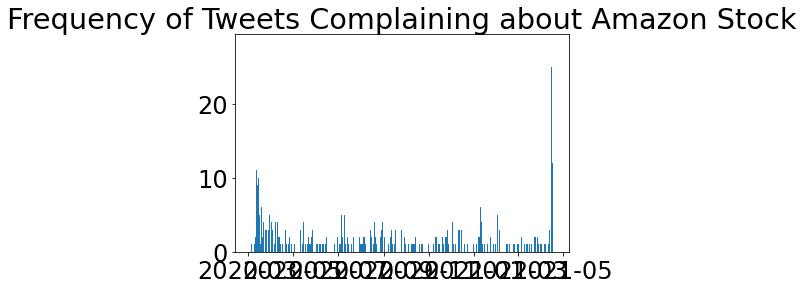

In [ ]:
plt.bar(stock_a['date'], stock_a['tweets'])
plt.title('Frequency of Tweets Complaining about Amazon Stock')
plt.show()

# CostCo

The same Sentiment Analsis and Noun Chunking process for Amazon is repeated for CostCo below.

In [ ]:
costco = pd.read_json('/content/gdrive/MyDrive/epsilon1.part3/costco.json', lines=True)

In [ ]:
# replace the patterns with an empty string - CostCo
costco['content'] = costco['content'].astype(str)
costco['stripped'] =  [re.sub(combined_pat, '', w) for w in costco.content]

costco = costco[['date', 'content', 'stripped', 'id', 'user', 'likeCount', 'lang', 'media', 'mentionedUsers', 'coordinates']].copy()

analyser = SentimentIntensityAnalyzer()

# Now get the compound sentiment score for each tweet - target
costco['C_Score'] = np.nan
for index, row in costco.iterrows(): 
    costco.loc[index, 'C_Score'] = analyser.polarity_scores(row['stripped'])['compound']

# create new column
sentiment = []

# Loop through rows of dataframe and determine strings for new column "Sentiment"
for index, row in costco.iterrows(): 
    if costco.loc[index, 'C_Score'] > 0.05 : 
        sentiment.append("Positive")      
    elif costco.loc[index, 'C_Score'] < -0.05 :
        sentiment.append("Negative")    
    else :
        sentiment.append("Neutral")    

costco['Sentiment'] = sentiment
costco['Sentiment'] = costco['Sentiment'].astype("category")

In [ ]:
print('CostCo:')
print(f"Count positive tweets: {sum(costco['C_Score'] > 0.05)}")
print(f"Count netural tweets: {costco['C_Score'].between(-0.05, 0.05).sum()}")
print(f"Count negative tweets: {sum(costco['C_Score'] < -0.05)}")
print(f"Total number of tweets: {costco['C_Score'].count()}")
      
display(costco.C_Score.describe())

CostCo:
Count positive tweets: 25337
Count netural tweets: 20188
Count negative tweets: 13109
Total number of tweets: 58634


count    58634.000000
mean         0.131306
std          0.436397
min         -0.989200
25%          0.000000
50%          0.000000
75%          0.476700
max          0.996500
Name: C_Score, dtype: float64

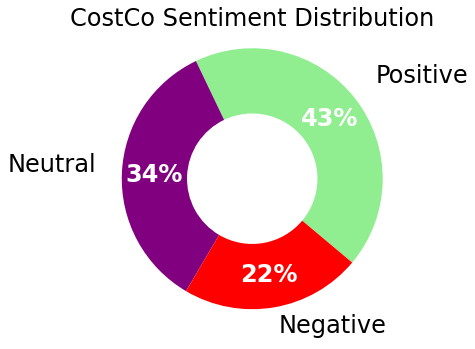

In [ ]:
# CostCo
# Set font size
plt.rcParams['font.size']=24

# Define figure
fig, ax = plt.subplots(figsize=(9, 6), subplot_kw=dict(aspect="equal"))

# Get count by sentiment category from tweets_df
sentiment_counts = costco.Sentiment.value_counts()
labels = sentiment_counts.index

# Define colors
color_palette_list = ['lightgreen', 'purple', 'red','orange']

# Generate graph components
wedges, texts, autotexts = ax.pie(sentiment_counts, wedgeprops=dict(width=0.5), startangle=-40,  
       colors=color_palette_list[0:3], autopct='%1.0f%%', pctdistance=.75, textprops={'color':"w", 'weight':'bold'})

# Plot wedges
for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    ax.annotate(labels[i], xy=(x, y), xytext=(1.2*x, 1.2*y),
                horizontalalignment=horizontalalignment)
# Set title
ax.set_title("CostCo Sentiment Distribution", y=.95, fontsize = 24)

# Show Donut Chart
plt.show()

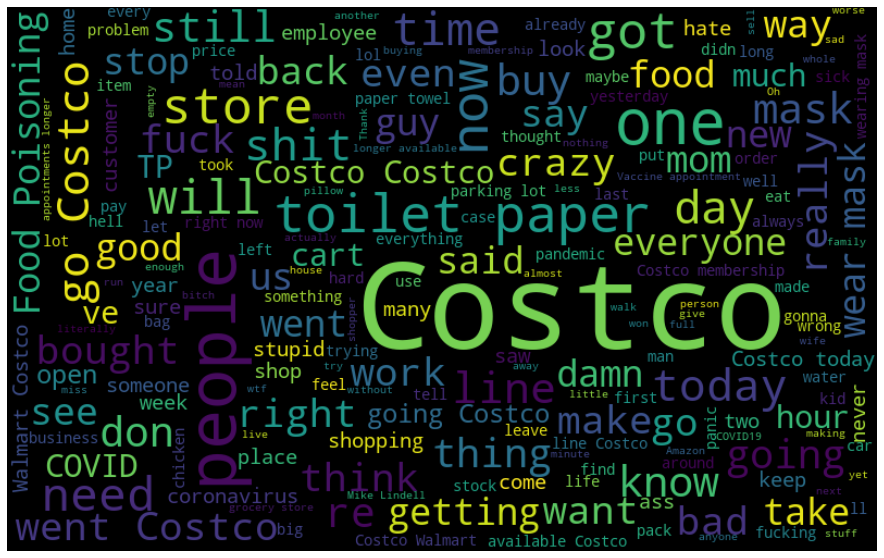

In [ ]:
# CostCo Word Cloud

# Create bag of words for tweets of certain sentiment
all_words = ' '.join([text for text in costco[costco['Sentiment'] == 'Negative']['stripped']])

# Generate Word Cloud
wordcloud = WordCloud(collocations=True, width=800, height=500, random_state=5, max_font_size=110).generate(all_words)

# Visulaize Cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [ ]:
# Set options to remove URL, Reserved word
prepro.set_options(prepro.OPT.URL, prepro.OPT.RESERVED)

# Let's do it for all tweets
costco['content'] = costco['content'].astype(str)
costco['text']  = costco['content'].apply(prepro.clean)
costco['content'] = costco['content'].astype(str)
costco['text']  = costco['content'].apply(prepro.clean)

# Check our work
costco['text'].tail(5)

58629                                                                               @jsnover All normal here. Well, as "normal" as Florida gets. But no run on anything at Costco or otherwise. Perhaps viruses are just too afraid of our crazy to come down here
58630                                                                                                   Just went to @Costco with friends. I'm pretty sure the fact one person in my state has #CoronaVirus is why the toilet paper and meds are pretty much gone.
58631    @aka_consuela On our first test run, we used air mattresses and sleeping bags. Later, I bought foam matresses from Costco that fold. Both systems are fine, but I think foam mattresses are more comfy. I put yoga mats under them for a bit of extra ...
58632                                                                   For the second time in two days, a customer asked me for help at both a grocery store AND CostCo. Both times I acted like an employee of the store. Do 

In [ ]:
# Replace html &amp; with and
costco['text'] =  [re.sub(r'&amp;', 'and', w) for w in costco.text]

# Remove other html entities 
htmlents = r'|'.join((r'&copy;',r'&reg;',r'&quot;',r'&gt;',r'&lt;',r'&nbsp;',r'&apos;',r'&cent;',r'&euro;',r'&pound;')) 
costco['text'] =  [re.sub(htmlents, '', w) for w in costco.text]

# Notice that Hashtags and Mentions are still in the tweets. Sometimes, we may want to treat them as nouns (e.g., for a brand or person)
# To do so, we need to remove the special characters # and @ using regular expressions

# Set-up patterns to be removed fro the tweets
htag = r'|'.join((r"#", r"@"))

# Now, replace the patterns with an empty string
costco['text'] =  [re.sub(htag, '', w) for w in costco.text]

# We might have double spaces now (because of empty string replacements above) - remove double empty spaces
#tweets['stripped']  = [re.sub(r"  ", ' ', w) for w in tweets.loc[:,'stripped']]
costco['text'] = costco.text.replace({' +':' '},regex=True)

# Check our Work
costco['text'].tail(5)

58629                                                                                jsnover All normal here. Well, as "normal" as Florida gets. But no run on anything at Costco or otherwise. Perhaps viruses are just too afraid of our crazy to come down here
58630                                                                                                     Just went to Costco with friends. I'm pretty sure the fact one person in my state has CoronaVirus is why the toilet paper and meds are pretty much gone.
58631    aka_consuela On our first test run, we used air mattresses and sleeping bags. Later, I bought foam matresses from Costco that fold. Both systems are fine, but I think foam mattresses are more comfy. I put yoga mats under them for a bit of extra c...
58632                                                                   For the second time in two days, a customer asked me for help at both a grocery store AND CostCo. Both times I acted like an employee of the store. Do 

In [ ]:
nlp = spacy.load('en')
c_neg = costco[costco['Sentiment'] == 'Negative']

In [ ]:
# Find Noun Chunks in each tweet (apply lambda function to each tweet that returns list of noun chunks) - This is computationally expensive and can take a while...
c_neg['Noun Chunks'] = c_neg.text.apply(lambda x:  list(str(y) for y in (nlp(x).noun_chunks)))
c_neg[['content','Noun Chunks']].tail()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,content,Noun Chunks
58626,@KYWeise I got a supermarket wholesale place and it had no lines. Still need to pick up some other things at Costco; cannot get thru this without some booze😉,"[KYWeise, I, a supermarket wholesale place, it, no lines, some other things, Costco, some booze]"
58627,People going to contract coronavirus at Costco as they prepare for doomsday,"[People, coronavirus, Costco, they, doomsday]"
58628,"Empty aisles at Costco are quite a unique sight, and people are hoarding drinking water. This is not happening because there is panic, but this will cause panic! #COVID https://t.co/fGyRpdsHuA","[Empty aisles, Costco, quite a unique sight, people, drinking water, panic, panic, COVID]"
58629,"@jsnover All normal here. Well, as ""normal"" as Florida gets. But no run on anything at Costco or otherwise.\nPerhaps viruses are just too afraid of our crazy to come down here https://t.co/Vz7ReivN5b","[jsnover, Florida, But no run, anything, Costco, viruses]"
58633,I guess one thing about being economically challenged is not having to wait in line at a Costco to buy up supplies.,"[I, one thing, line, a Costco, supplies]"


In [ ]:
c_neg.rename(columns = {'Noun Chunks' : 'NounChunks'}, inplace = True)
c_neg['Chunks'] = c_neg['NounChunks'].apply(lambda x: cleanNouns(x))

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


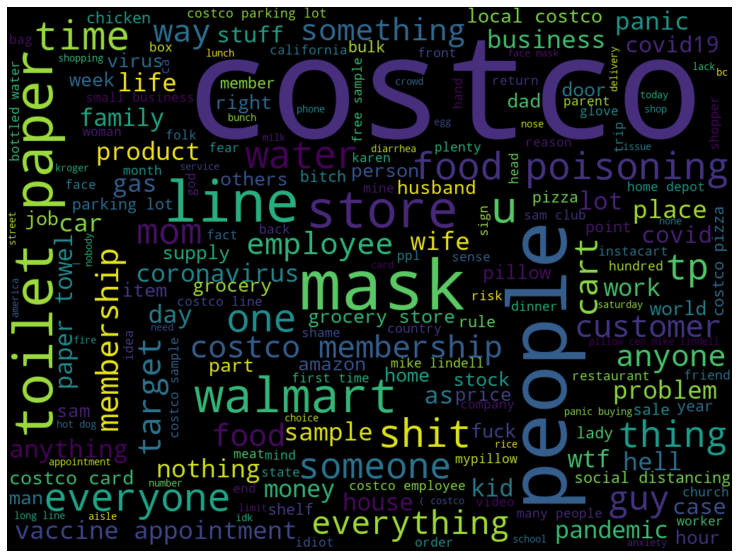

In [ ]:
# CostCo Noun Chunks Vis
nchunks = list(itertools.chain.from_iterable(c_neg.Chunks))

# Convert it to dictionary with values and its occurences
word_cloud_dict=Counter(nchunks)

# Now create a word cloud based on Noun Chunks
wordcloud = WordCloud(width = 1024, height = 768).generate_from_frequencies(word_cloud_dict)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [ ]:
str_chunks = []
for x in c_neg['Chunks']:
  str_chunks.append(''.join(x))

c_neg['StringChunks'] = str_chunks

In [ ]:
stock_mention = []
for index, row in c_neg.iterrows():
  if 'stock' in row['StringChunks']:
    stock_mention.append(1)
  else:
    stock_mention.append(0)
c_neg['stock_mention'] = stock_mention

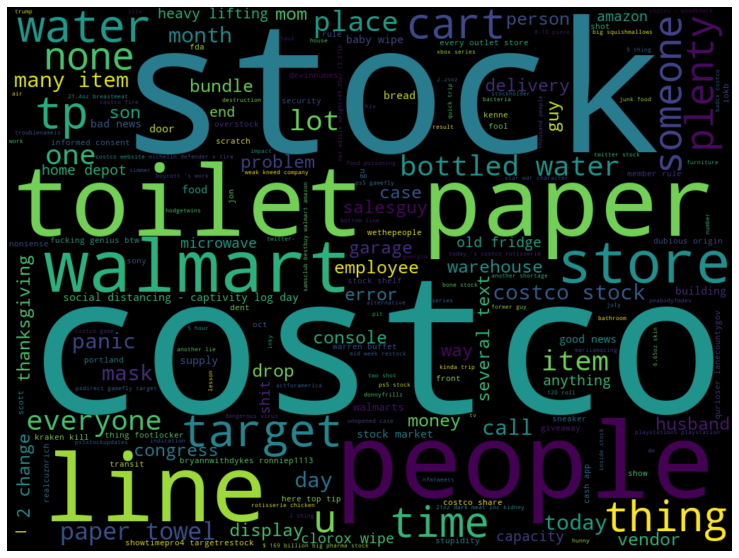

In [ ]:
# CostCo narrowed down analysis
pd.set_option('max_colwidth', 250)
# c_neg_p = c_neg[~c_neg['StringChunks'].str.contains('vote|voting')]
c_neg_p = c_neg[c_neg['StringChunks'].str.contains('stock')]

# CostCo narrowed down Noun Chunks Vis
nchunks = list(itertools.chain.from_iterable(c_neg_p.Chunks))

# Convert it to dictionary with values and its occurences
word_cloud_dict=Counter(nchunks)

# Now create a word cloud based on Noun Chunks
wordcloud = WordCloud(width = 1024, height = 768).generate_from_frequencies(word_cloud_dict)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

The following graph shows the amount of Tweets complaining about stock at CostCo from March 2020 through April 2021

In [ ]:
import datetime as dt

dates = c_neg_p['date'].dt.date.unique()
tweets = []
for d in dates:
  temp = c_neg_p[c_neg_p['date'].dt.date == d]
  tweets.append(sum(temp['stock_mention']))

stock_c = pd.DataFrame({'date': dates, 'tweets': tweets})

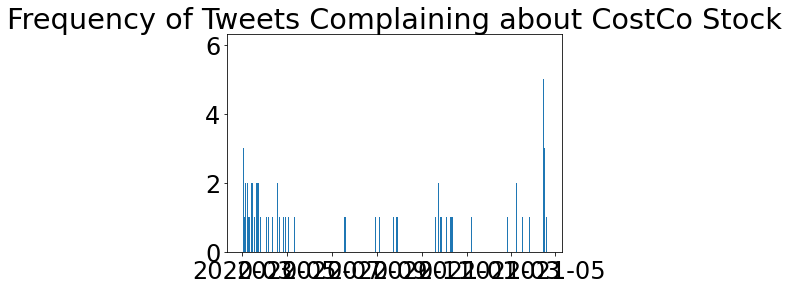

In [ ]:
plt.bar(stock_c['date'], stock_c['tweets'])
plt.title('Frequency of Tweets Complaining about CostCo Stock')
plt.show()